## Table of Contents

- [Problem Statement](#problem-statement)
  - [Context](#context)
  - [Objective](#objective)
  - [Data Dictionary](#data-dictionary)
- [Libraries](#libraries)
  - [Import libraries](#import-libraries)
- [Using VKPyKit - My own PyPi package](#using-vkpykit---my-own-pypi-package)
- [Load the Data](#load-the-data)
- [Data Overview and Treatment to Prepare for ML](#data-overview-and-treatment-to-prepare-for-ml)
  - [Sanity checks](#sanity-checks)
  - [Drop ID, it is not required for any analysis](#drop-id-it-is-not-required-for-any-analysis)
  - [Check Uniques](#check-uniques)
  - [Check for Unique Experience and treat it](#check-for-unique-experience-and-treat-it)
  - [Check Experience](#check-experience)
  - [Check Age](#check-age)
  - [Check ZipCode and Treat it](#check-zipcode-and-treat-it)
    - [Zipcde treatment](#zipcde-treatment)
  - [Check Uniques again](#check-uniques-again)
  - [Category Columns](#category-columns)
- [Exploratory Data Analysis.](#exploratory-data-analysis)
    - [Boxplot and histogram to visualize the data distribution](#boxplot-and-histogram-to-visualize-the-data-distribution)
    - [Distribution of target variable](#distribution-of-target-variable)
    - [Check the percentages for each indepenent variable](#check-the-percentages-for-each-indepenent-variable)
    - [Barplot with labels](#barplot-with-labels)
    - [Check for Outliers once more](#check-for-outliers-once-more)
    - [Heatmap to understand relationships](#heatmap-to-understand-relationships)
    - [Pairplot to verify relationships](#pairplot-to-verify-relationships)
    - [Check Quartile ranges](#check-quartile-ranges)
    - [EDA Observations](#eda-observations)
    - [Data Preprocessing](#data-preprocessing)
- [Model Work](#model-work)
  - [Model Evaluation Criterion](#model-evaluation-criterion)
  - [Create Test and Train](#create-test-and-train)
  - [Model Default](#model-default)
    - [Model Default - Visualize Decision Tree](#model-default---visualize-decision-tree)
    - [Nodel Default - Confusion Matrix](#nodel-default---confusion-matrix)
- [Model - Pruning - Reduce Over/Under fittings](#model---pruning---reduce-overunder-fittings)
  - [Pre Pruning](#pre-pruning)
  - [Post Pruning](#post-pruning)
- [Model Performance Comparison and Final Model Selection - Pruning](#model-performance-comparison-and-final-model-selection---pruning)
- [Appendix](#appendix)
- [Other way to do the same](#other-way-to-do-the-same)
  - [Prepruning](#prepruning)
  - [Post Pruning](#post-pruning)
  - [Model Performance Comparison and Final Model Selection - Other way](#model-performance-comparison-and-final-model-selection---other-way)
- [Actionable Insights and Business Recommendations](#actionable-insights-and-business-recommendations)

## Problem Statement

### Context

AllLife Bank is a US bank that has a growing customer base. The majority of these customers are liability customers (depositors) with varying sizes of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors).

A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio.

You as a Data scientist at AllLife bank have to build a model that will help the marketing department to identify the potential customers who have a higher probability of purchasing the loan.

### Objective

To predict whether a liability customer will buy personal loans, to understand which customer attributes are most significant in driving purchases, and identify which segment of customers to target more.

### Data Dictionary
* `ID`: Customer ID
* `Age`: Customer’s age in completed years
* `Experience`: #years of professional experience
* `Income`: Annual income of the customer (in thousand dollars)
* `ZIP Code`: Home Address ZIP code.
* `Family`: the Family size of the customer
* `CCAvg`: Average spending on credit cards per month (in thousand dollars)
* `Education`: Education Level. 1: Undergrad; 2: Graduate;3: Advanced/Professional
* `Mortgage`: Value of house mortgage if any. (in thousand dollars)
* `Personal_Loan`: Did this customer accept the personal loan offered in the last campaign? (0: No, 1: Yes)
* `Securities_Account`: Does the customer have securities account with the bank? (0: No, 1: Yes)
* `CD_Account`: Does the customer have a certificate of deposit (CD) account with the bank? (0: No, 1: Yes)
* `Online`: Do customers use internet banking facilities? (0: No, 1: Yes)
* `CreditCard`: Does the customer use a credit card issued by any other Bank (excluding All life Bank)? (0: No, 1: Yes)

## Libraries

In [1]:
# Installing the libraries with the specified version.
# !pip install numpy==2.0.2 pandas==2.2.2 matplotlib==3.10.0 seaborn==0.13.2 scikit-learn==1.6.1 sklearn-pandas==2.2.0 -q --user
# !pip install numpy pandas matplotlib seaborn scikit-learn sklearn-pandas vkpyplot -q 
!pip install -r ../requirements.txt -q
#--user

**Note**:

1. After running the above cell, kindly restart the notebook kernel (for Jupyter Notebook) or runtime (for Google Colab), write the relevant code for the project from the next cell, and run all cells sequentially from the next cell.

2. On executing the above line of code, you might see a warning regarding package dependencies. This error message can be ignored as the above code ensures that all necessary libraries and their dependencies are maintained to successfully execute the code in this notebook.

### Import libraries

In [2]:
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Library to split data
from sklearn.model_selection import train_test_split

# To build model for prediction
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
)

# to suppress unnecessary warnings
import warnings
warnings.filterwarnings("ignore")



## Using VKPyKit - My own PyPi package
- This is available with PIP
- Instead of writing these functions over and over, I am writing my own package to reduce repeated work. 
- [pip install VKPyKit](https://pypi.org/project/VKPyKit/)
- Please check requirements.txt as below. 

In [3]:
# numpy
# pandas 
# matplotlib
# seaborn
# plotly
# scikit-learn
# statsmodels
# vkpykit
# plotly
# plotly-express
# nbformat
# jinja2
# sklearn-pandas
# sqlalchemy-mate==2.0.0.0
# 


## Using my own Pythn libraries for Exploratory Data Analysis and Decision Tree Modeling.
## 1. EDA - Exploratory Data Analysis
## 2. DT - Decision Tree
## Easier to write once and use as packaged functions. 
from VKPyKit.EDA import *
from VKPyKit.DT import *

EDA= EDA()
DT = DT()

## Load the Data

In [4]:
loans = pd.read_csv('loan_modelling.csv')
data = loans.copy()

## Data Overview and Treatment to Prepare for ML

### Sanity checks

In [5]:
# Display the first 5 rows of the dataset
data.head()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [6]:
# Display the last 5 rows of the dataset
data.tail()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0
4999,5000,28,4,83,92612,3,0.8,1,0,0,0,0,1,1


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIPCode             5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal_Loan       5000 non-null   int64  
 10  Securities_Account  5000 non-null   int64  
 11  CD_Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [8]:
data.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIPCode,5000.0,93169.257000,1759.455086,90005.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal_Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


### Drop ID, it is not required for any analysis

In [9]:
data.drop(columns=['ID'], inplace=True) 

### Check Uniques

In [10]:
display(data.nunique())

Age                    45
Experience             47
Income                162
ZIPCode               467
Family                  4
CCAvg                 108
Education               3
Mortgage              347
Personal_Loan           2
Securities_Account      2
CD_Account              2
Online                  2
CreditCard              2
dtype: int64

### Check for Unique Experience and treat it

In [11]:
data["Experience"].unique()

array([ 1, 19, 15,  9,  8, 13, 27, 24, 10, 39,  5, 23, 32, 41, 30, 14, 18,
       21, 28, 31, 11, 16, 20, 35,  6, 25,  7, 12, 26, 37, 17,  2, 36, 29,
        3, 22, -1, 34,  0, 38, 40, 33,  4, -2, 42, -3, 43])

In [12]:
#Making all Experience values positive
data['Experience'] = data['Experience'].apply(lambda x: abs(x))

In [13]:
data["Experience"].unique()

array([ 1, 19, 15,  9,  8, 13, 27, 24, 10, 39,  5, 23, 32, 41, 30, 14, 18,
       21, 28, 31, 11, 16, 20, 35,  6, 25,  7, 12, 26, 37, 17,  2, 36, 29,
        3, 22, 34,  0, 38, 40, 33,  4, 42, 43])

### Check Experience

In [14]:
data["Education"].unique()

array([1, 2, 3])

### Check Age

In [15]:
data['Age'].unique()

array([25, 45, 39, 35, 37, 53, 50, 34, 65, 29, 48, 59, 67, 60, 38, 42, 46,
       55, 56, 57, 44, 36, 43, 40, 30, 31, 51, 32, 61, 41, 28, 49, 47, 62,
       58, 54, 33, 27, 66, 24, 52, 26, 64, 63, 23])

### Check ZipCode and Treat it

In [16]:
data["ZIPCode"].unique()

array([91107, 90089, 94720, 94112, 91330, 92121, 91711, 93943, 93023,
       94710, 90277, 93106, 94920, 91741, 95054, 95010, 94305, 91604,
       94015, 90095, 91320, 95521, 95064, 90064, 94539, 94104, 94117,
       94801, 94035, 92647, 95814, 94114, 94115, 92672, 94122, 90019,
       95616, 94065, 95014, 91380, 95747, 92373, 92093, 94005, 90245,
       95819, 94022, 90404, 93407, 94523, 90024, 91360, 95670, 95123,
       90045, 91335, 93907, 92007, 94606, 94611, 94901, 92220, 93305,
       95134, 94612, 92507, 91730, 94501, 94303, 94105, 94550, 92612,
       95617, 92374, 94080, 94608, 93555, 93311, 94704, 92717, 92037,
       95136, 94542, 94143, 91775, 92703, 92354, 92024, 92831, 92833,
       94304, 90057, 92130, 91301, 92096, 92646, 92182, 92131, 93720,
       90840, 95035, 93010, 94928, 95831, 91770, 90007, 94102, 91423,
       93955, 94107, 92834, 93117, 94551, 94596, 94025, 94545, 95053,
       90036, 91125, 95120, 94706, 95827, 90503, 90250, 95817, 95503,
       93111, 94132,

#### Zipcde treatment
- Using uszipcode library to reduce number of values in ZipCode field

In [17]:
# Function to get state from zip code, hoping to get state information for better analysis. 
from uszipcode import SearchEngine

searchengine = SearchEngine()

def get_state_from_zip(zip_code):
    """
    Retrieves the state abbreviation for a given zip code.
    Returns None if the zip code is not found.
    """
    try:
        zip_info = searchengine.by_zipcode(zipcode= zip_code)
        if zip_info:
            return zip_info.state
        else:
            return zip_code
    except Exception as e:
        print(f"Error processing zip code {zip_code}: {e}")
        return None

In [18]:
data["ZIPCodeState"] = data["ZIPCode"].apply(lambda x: get_state_from_zip(x))
display(data["ZIPCodeState"].unique())
display(data.groupby("ZIPCodeState").size())

array(['CA', 92717, 93077, 92634, 96651], dtype=object)

ZIPCodeState
92634       5
92717      22
93077       1
96651       6
CA       4966
dtype: int64

Observation
- State does not make much difference, all these are in CA. 
- Also, there are some zipcodes are not mapped to State, which is perticularly an issue. So might as well drop it. 
- Lets favor to the first three digits in Zipcode. 

In [19]:
data.drop(columns=['ZIPCodeState'], inplace=True) # Dropping ZIPCodeState column as it provides no new information

Observation
- State can't be found for some zipcode values, some zip codes are invalid
- So lets use first 3 digits of Zip code. 


In [20]:
data["ZIPCode"] = data["ZIPCode"].astype(str)
data["ZIPCode"] = data["ZIPCode"].str[0:3]
data["ZIPCode"] = data["ZIPCode"].astype("category")
display(data["ZIPCode"].unique())

['911', '900', '947', '941', '913', ..., '966', '960', '953', '903', '918']
Length: 57
Categories (57, object): ['900', '902', '903', '904', ..., '959', '960', '961', '966']

Observation 
- We reduced the number of unique zip codes from 467 to 57 by taking first 3 digits of zip code.
- It would be interesting to see if we can take first 2 characters? and reduce it further?

In [21]:
data["ZIPCode"] = data["ZIPCode"].astype(str)
data["ZIPCode"] = data["ZIPCode"].str[0:2]
data["ZIPCode"] = data["ZIPCode"].astype("category")
display(data["ZIPCode"].unique())

['91', '90', '94', '92', '93', '95', '96']
Categories (7, object): ['90', '91', '92', '93', '94', '95', '96']

### Check Uniques again

In [22]:
data.nunique()

Age                    45
Experience             44
Income                162
ZIPCode                 7
Family                  4
CCAvg                 108
Education               3
Mortgage              347
Personal_Loan           2
Securities_Account      2
CD_Account              2
Online                  2
CreditCard              2
dtype: int64

### Category Columns

Observation
If less than a few unique values, it is worth changing to category columns.

Age                    45
Experience             44
Income                162
ZIPCode                 7 - Category?
Family                  4 - Can be category, but let's try with numerical. 
CCAvg                 108
Education               3 - Can be category, but let's try with numerical. 
Mortgage              347
Personal_Loan           2 - Response Variable - Category?
Securities_Account      2 - Category?
CD_Account              2 - Category?
Online                  2 - Category?
CreditCard              2 - Category?

In [23]:
## Convert to 'category'
categoryCols = [
    "Personal_Loan",
    "Securities_Account",
    "CD_Account",
    "Online",
    "CreditCard",
    "ZIPCode",
]
data[categoryCols] = data[categoryCols].astype('category')
display(data.info())
display(data.describe(include='all').T)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Age                 5000 non-null   int64   
 1   Experience          5000 non-null   int64   
 2   Income              5000 non-null   int64   
 3   ZIPCode             5000 non-null   category
 4   Family              5000 non-null   int64   
 5   CCAvg               5000 non-null   float64 
 6   Education           5000 non-null   int64   
 7   Mortgage            5000 non-null   int64   
 8   Personal_Loan       5000 non-null   category
 9   Securities_Account  5000 non-null   category
 10  CD_Account          5000 non-null   category
 11  Online              5000 non-null   category
 12  CreditCard          5000 non-null   category
dtypes: category(6), float64(1), int64(6)
memory usage: 303.8 KB


None

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,5000.0,NaN,NaN,NaN,45.3384,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,NaN,NaN,NaN,20.1346,11.415189,0.0,10.0,20.0,30.0,43.0
Income,5000.0,NaN,NaN,NaN,73.7742,46.033729,8.0,39.0,64.0,98.0,224.0
ZIPCode,5000,7,94,1472,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Family,5000.0,NaN,NaN,NaN,2.3964,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,NaN,NaN,NaN,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,NaN,NaN,NaN,1.881,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,NaN,NaN,NaN,56.4988,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,2.0,0.0,4520.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Securities_Account,5000.0,2.0,0.0,4478.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Exploratory Data Analysis.

#### Boxplot and histogram to visualize the data distribution

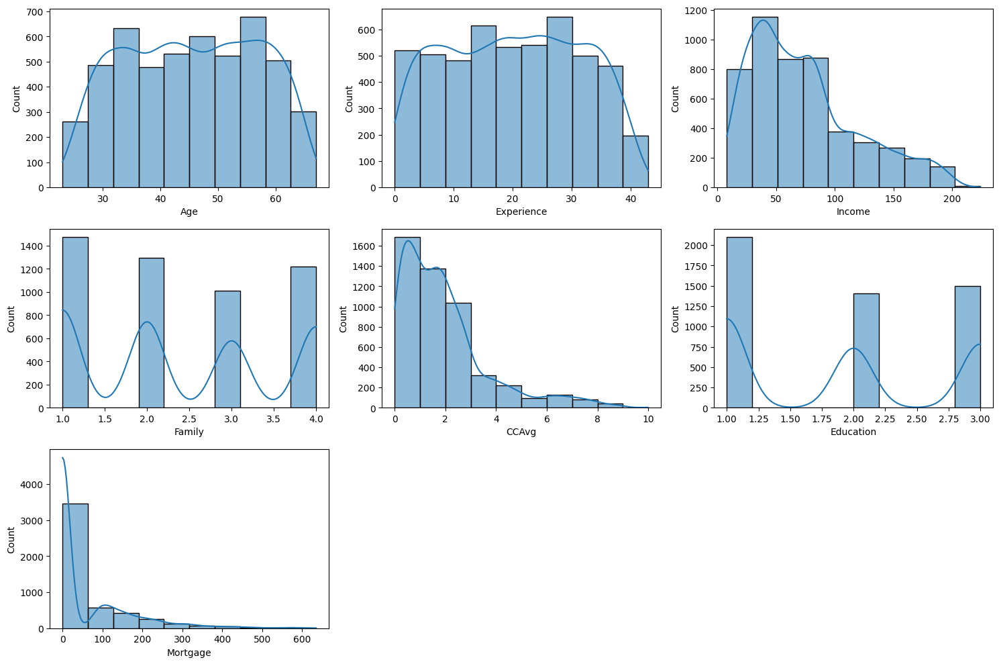

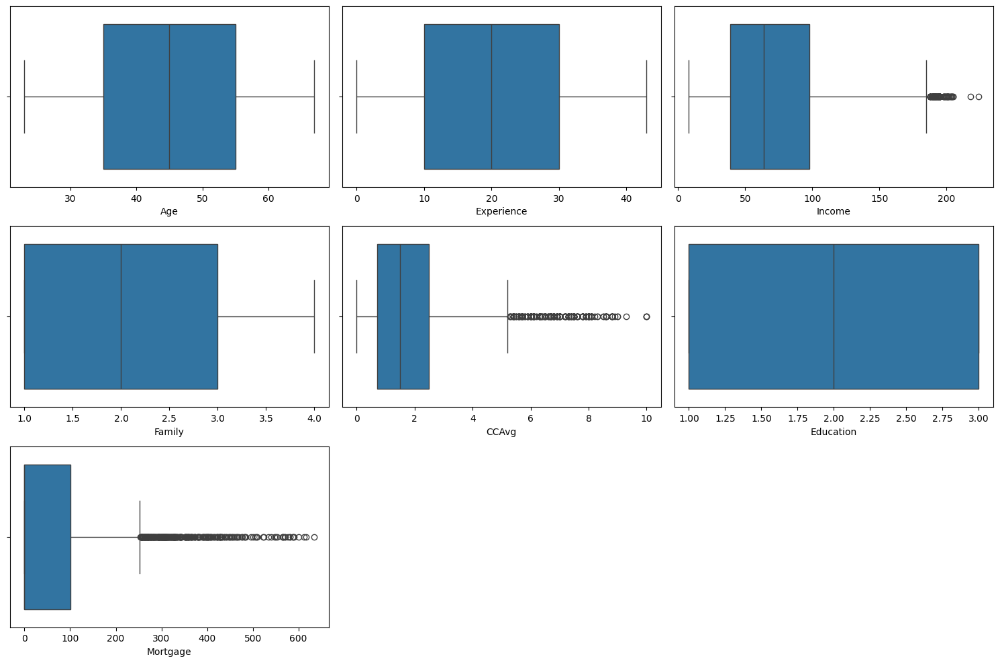

In [24]:
EDA.histogram_boxplot_all(data,kde=True)

Observations
- Income, Mortgage and CC Spending is righ skewed
- Age, Education and family seem to be well balanced within applicants
- Too many outliers in Mortgage, Income and CC. 

#### Distribution of target variable

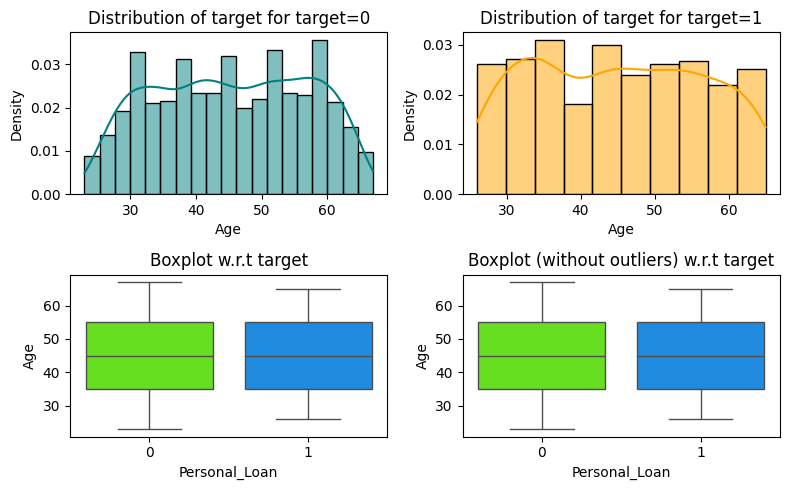

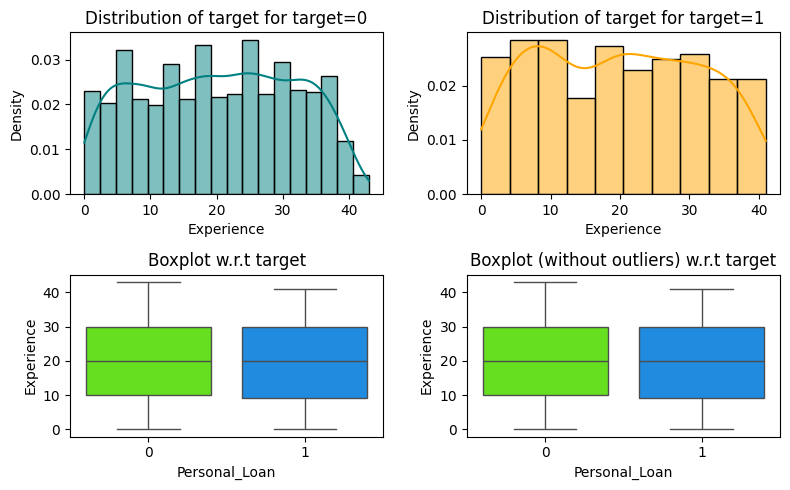

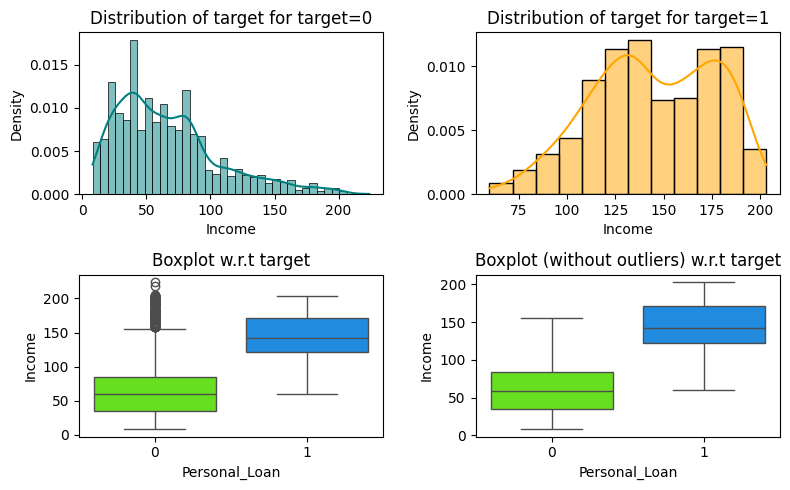

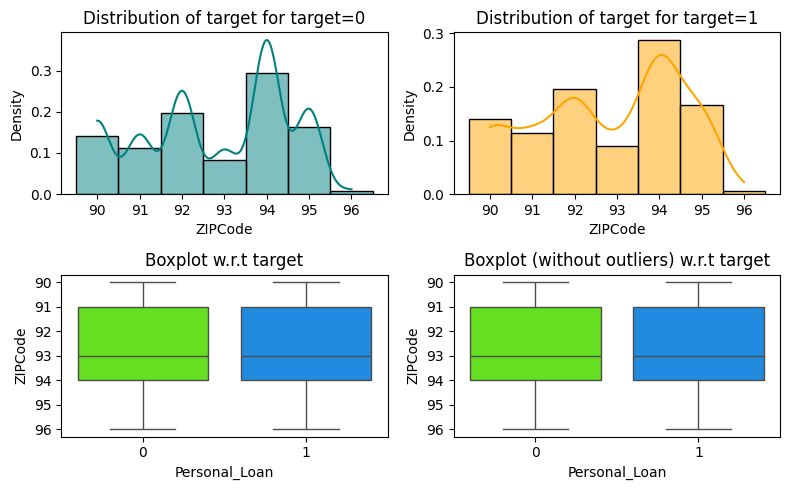

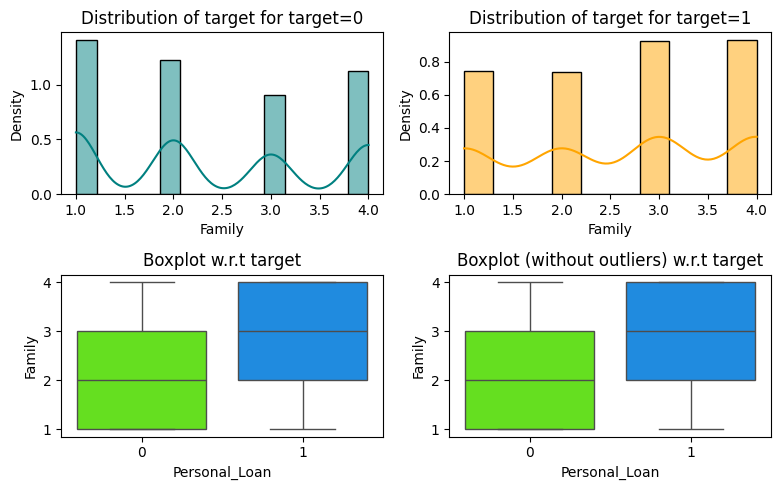

...

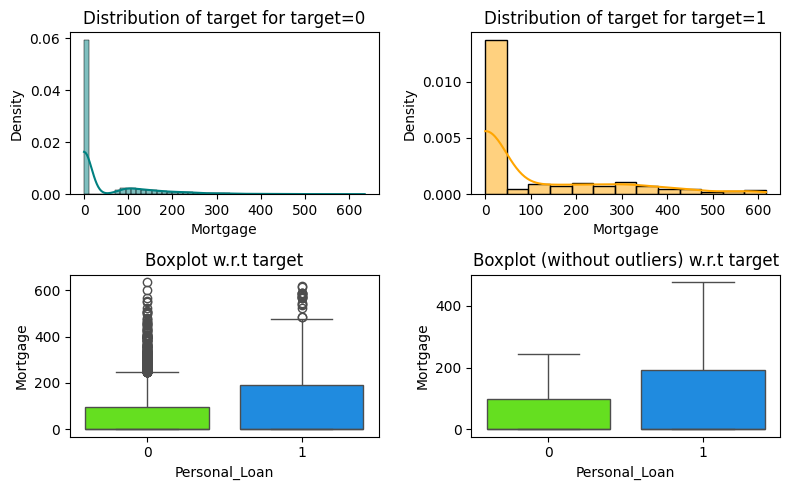

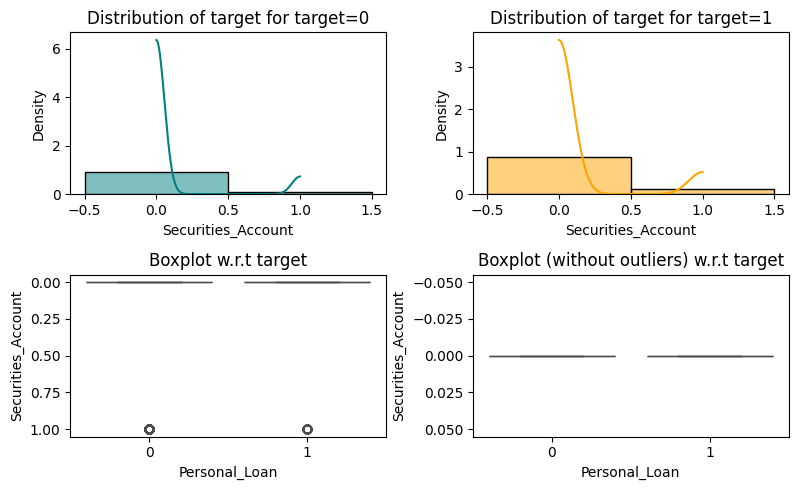

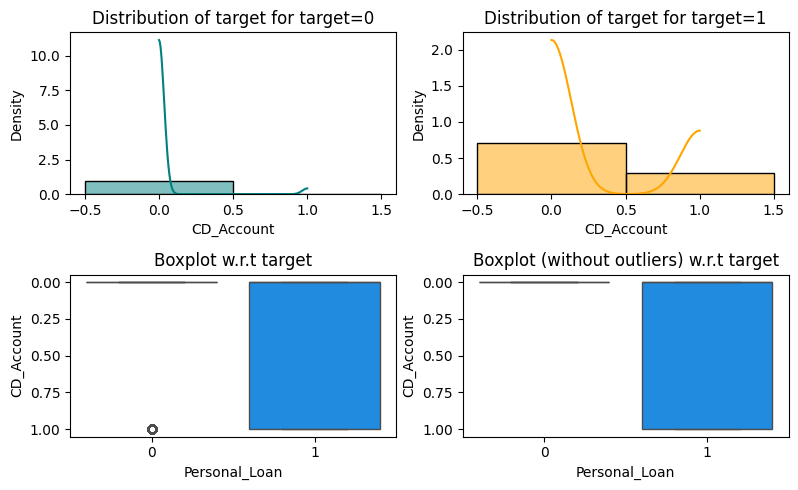

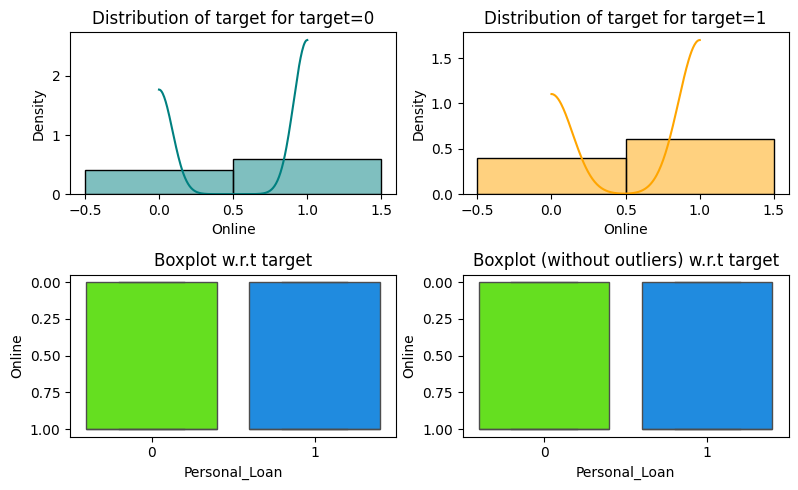

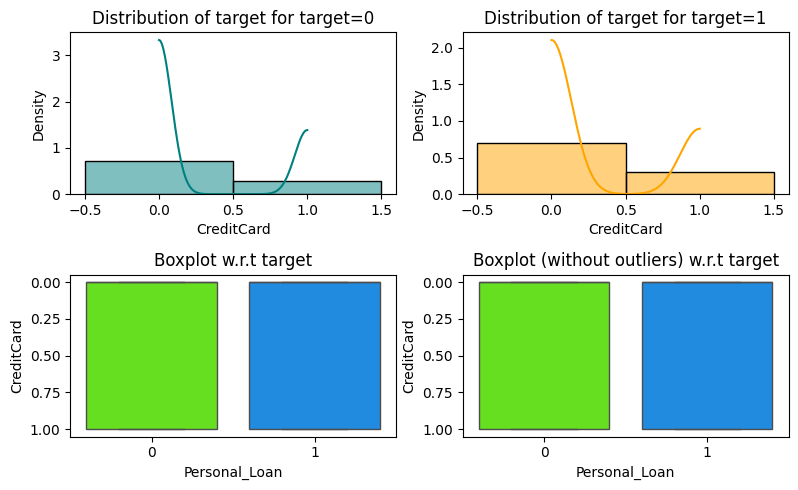

----------------------------------------------------------------------------------------------------


In [25]:
# Lets check distribution of target variable
EDA.distribution_plot_for_target_all(data,data.columns,"Personal_Loan",figsize=(8,5))

#### Check the percentages for each indepenent variable

Personal_Loan     0    1   All
Age                           
All            4520  480  5000
34              116   18   134
30              119   17   136
36               91   16   107
63               92   16   108
35              135   16   151
33              105   15   120
52              130   15   145
29              108   15   123
54              128   15   143
43              134   15   149
42              112   14   126
56              121   14   135
65               66   14    80
44              107   14   121
50              125   13   138
45              114   13   127
46              114   13   127
26               65   13    78
32              108   12   120
57              120   12   132
38              103   12   115
27               79   12    91
48              106   12   118
61              110   12   122
53              101   11   112
51              119   10   129
60              117   10   127
58              133   10   143
49              105   10   115
47      

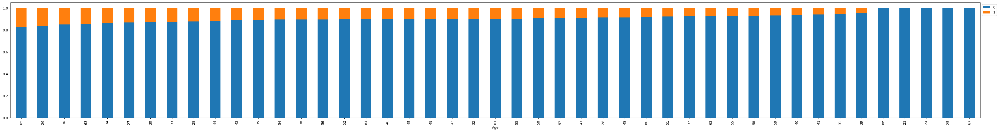

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
Experience                    
All            4520  480  5000
9               127   20   147
8               101   18   119
3               116   17   133
20              131   17   148
12               86   16   102
5               132   14   146
32              140   14   154
26              120   14   134
25              128   14   142
19              121   14   135
16              114   13   127
37              103   13   116
35              130   13   143
30              113   13   126
23              131   13   144
22              111   13   124
11              103   13   116
31               92   12   104
36              102   12   114
6               107   12   119
18              125   12   137
7               109   12   121
29              112   12   124
28              127   11   138
17              114   11   125
13              106   11   117
21              102   11   113
39               75   10    85
34              115   10   125
27      

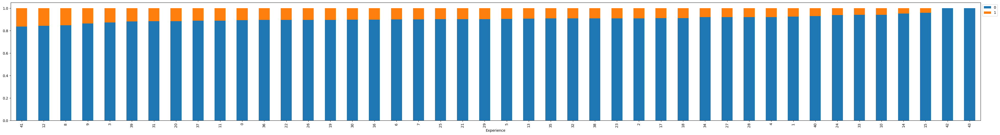

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
Income                        
All            4520  480  5000
130               8   11    19
182               2   11    13
158               8   10    18
135               8   10    18
...             ...  ...   ...
41               82    0    82
40               78    0    78
39               81    0    81
38               84    0    84
8                23    0    23

[163 rows x 3 columns]
----------------------------------------------------------------------------------------------------


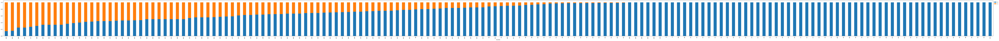

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
ZIPCode                       
All            4520  480  5000
94             1334  138  1472
92              894   94   988
95              735   80   815
90              636   67   703
91              510   55   565
93              374   43   417
96               37    3    40
----------------------------------------------------------------------------------------------------


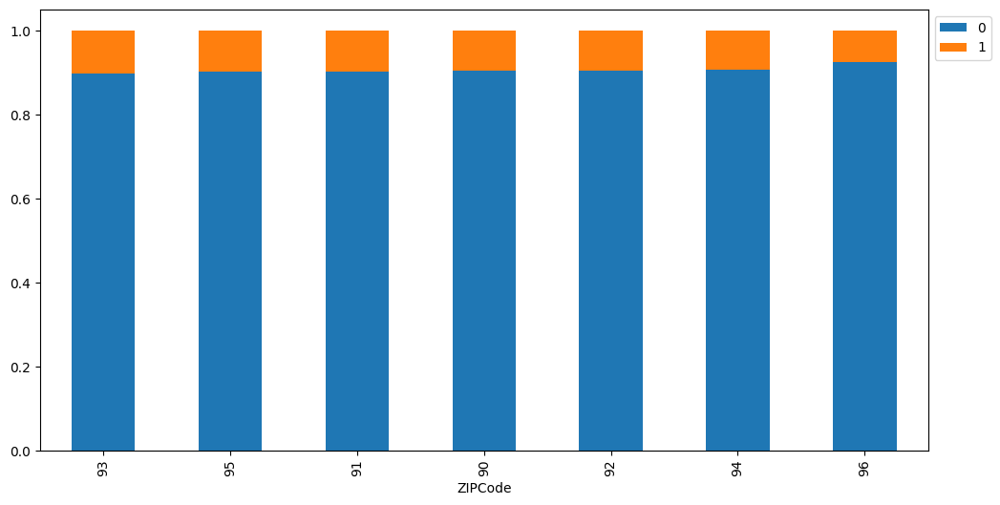

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
Family                        
All            4520  480  5000
4              1088  134  1222
3               877  133  1010
1              1365  107  1472
2              1190  106  1296
----------------------------------------------------------------------------------------------------


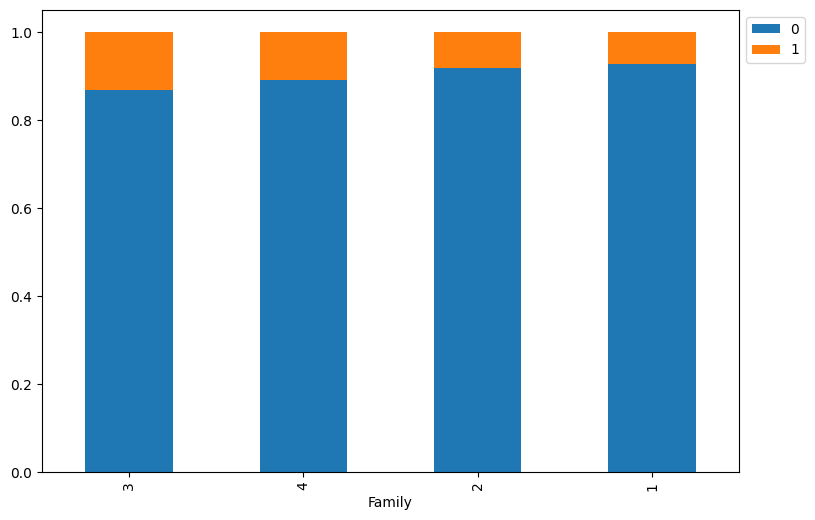

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
CCAvg                         
All            4520  480  5000
3.0              34   19    53
4.1               9   13    22
3.4              26   13    39
3.1               8   12    20
...             ...  ...   ...
1.67             18    0    18
1.75              9    0     9
7.8               9    0     9
7.6               9    0     9
2.33             18    0    18

[109 rows x 3 columns]
----------------------------------------------------------------------------------------------------


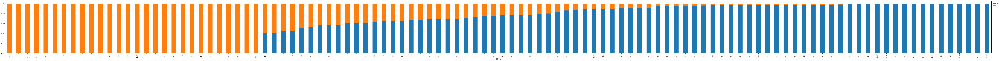

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
Education                     
All            4520  480  5000
3              1296  205  1501
2              1221  182  1403
1              2003   93  2096
----------------------------------------------------------------------------------------------------


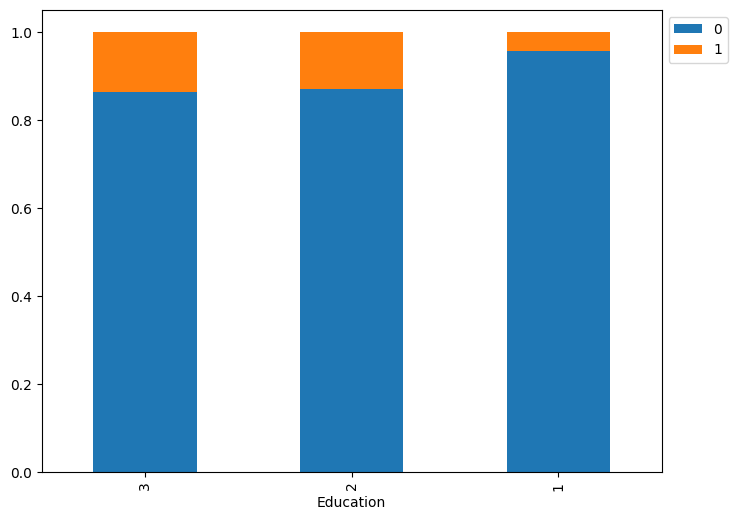

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
Mortgage                      
All            4520  480  5000
0              3150  312  3462
301               0    5     5
342               1    3     4
282               0    3     3
...             ...  ...   ...
276               2    0     2
156               5    0     5
278               1    0     1
280               2    0     2
248               3    0     3

[348 rows x 3 columns]
----------------------------------------------------------------------------------------------------


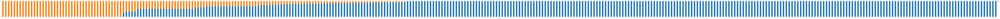

----------------------------------------------------------------------------------------------------


Personal_Loan          0    1   All
Securities_Account                 
All                 4520  480  5000
0                   4058  420  4478
1                    462   60   522
----------------------------------------------------------------------------------------------------


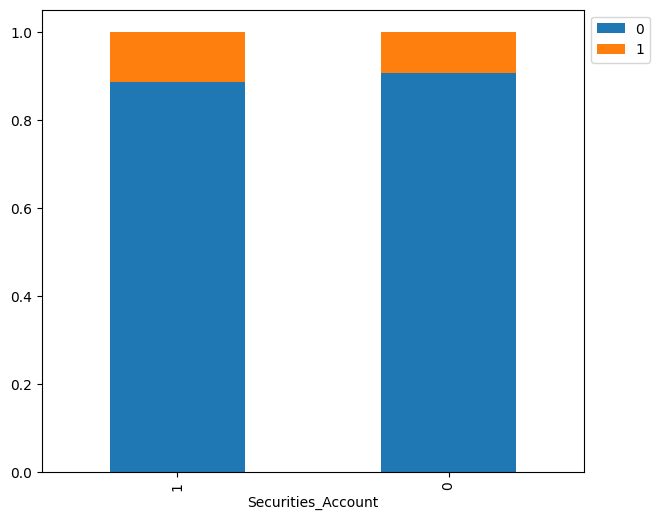

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
CD_Account                    
All            4520  480  5000
0              4358  340  4698
1               162  140   302
----------------------------------------------------------------------------------------------------


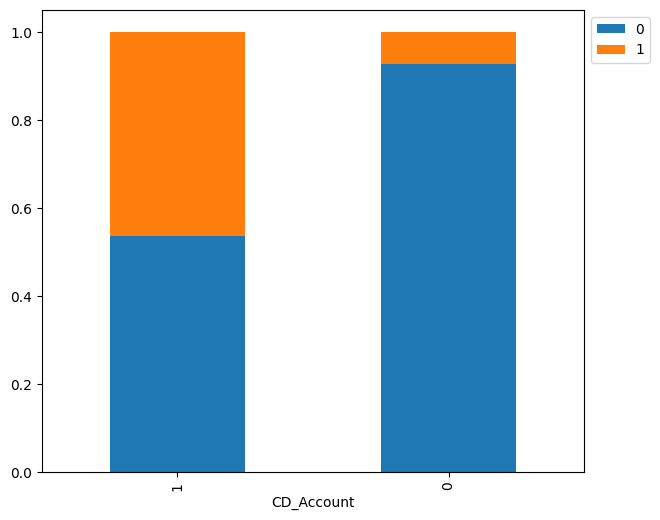

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
Online                        
All            4520  480  5000
1              2693  291  2984
0              1827  189  2016
----------------------------------------------------------------------------------------------------


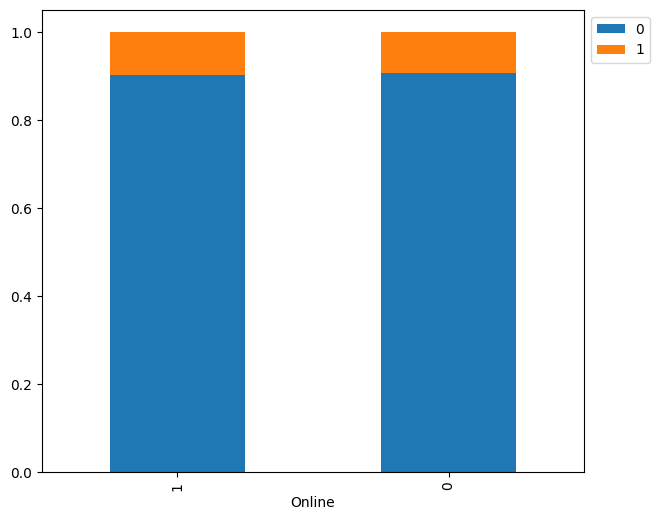

----------------------------------------------------------------------------------------------------


Personal_Loan     0    1   All
CreditCard                    
All            4520  480  5000
0              3193  337  3530
1              1327  143  1470
----------------------------------------------------------------------------------------------------


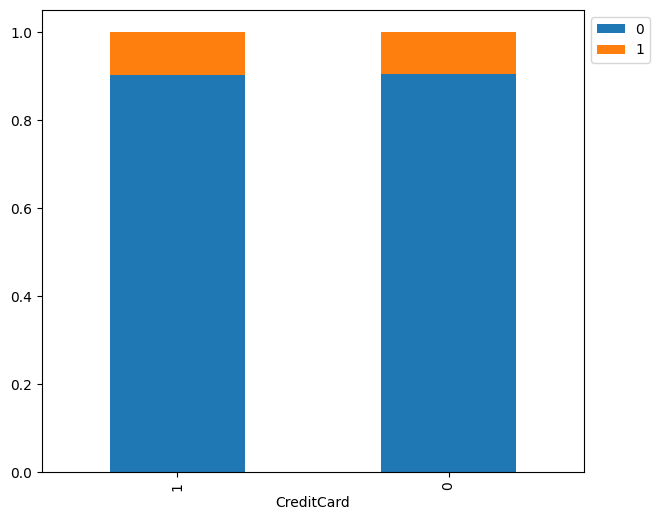

----------------------------------------------------------------------------------------------------


In [26]:
# Check distribution of target variable
EDA.barplot_stacked_all(data=data,predictors=data.columns,target="Personal_Loan")

#### Barplot with labels

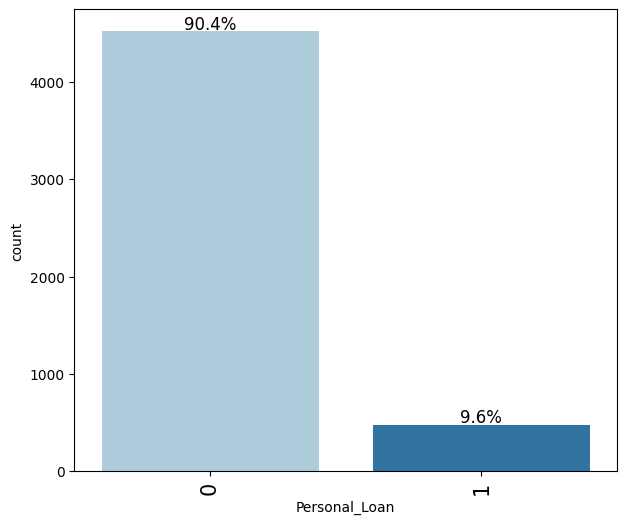

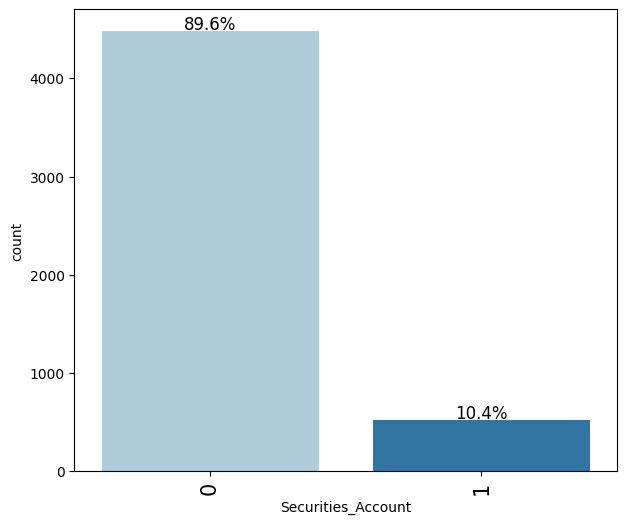

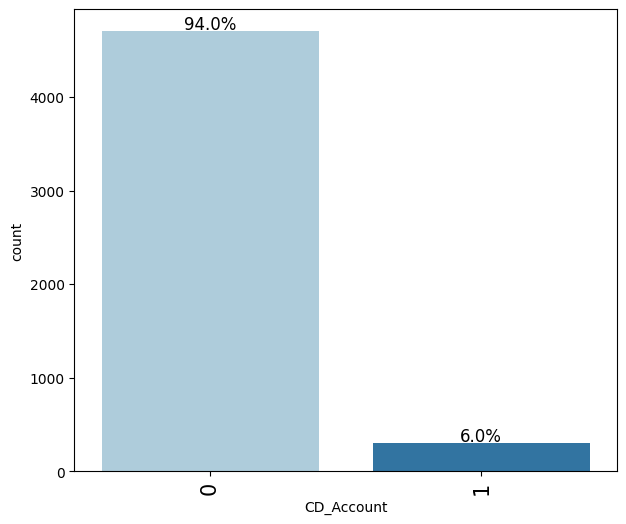

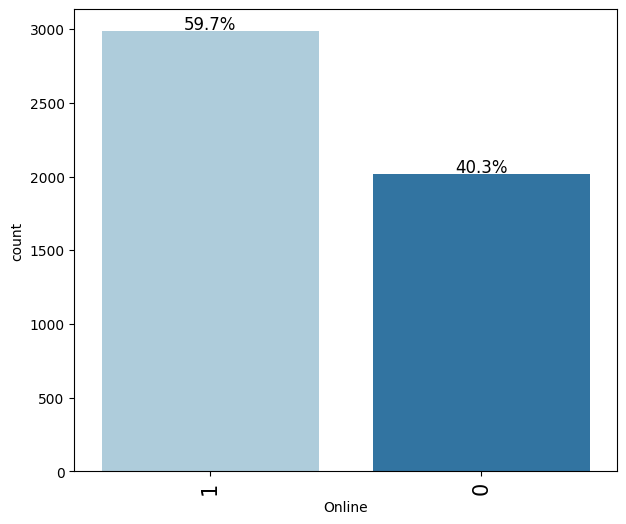

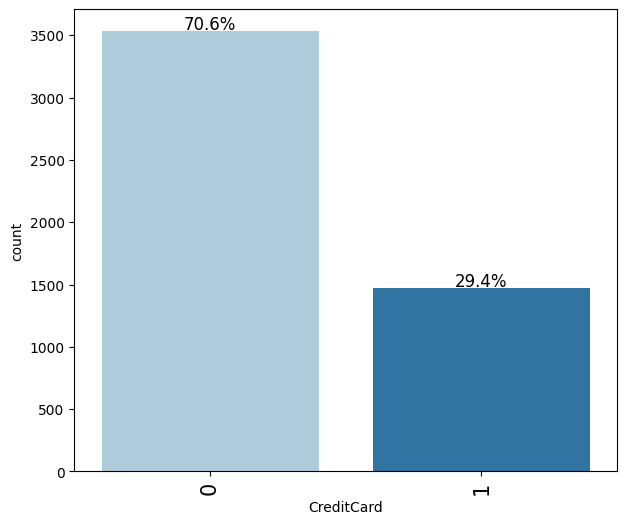

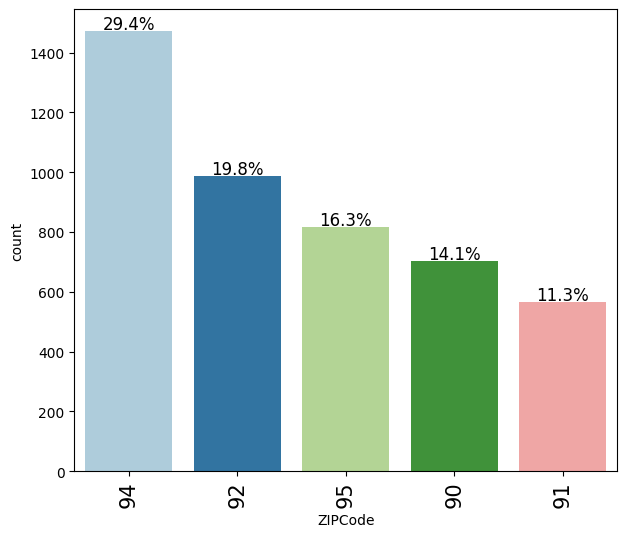

In [27]:
# Barplot for all categorical columns, to see percentages
for feature in categoryCols:
    EDA.barplot_labeled(data,feature,True,category_levels=5)


#### Check for Outliers once more

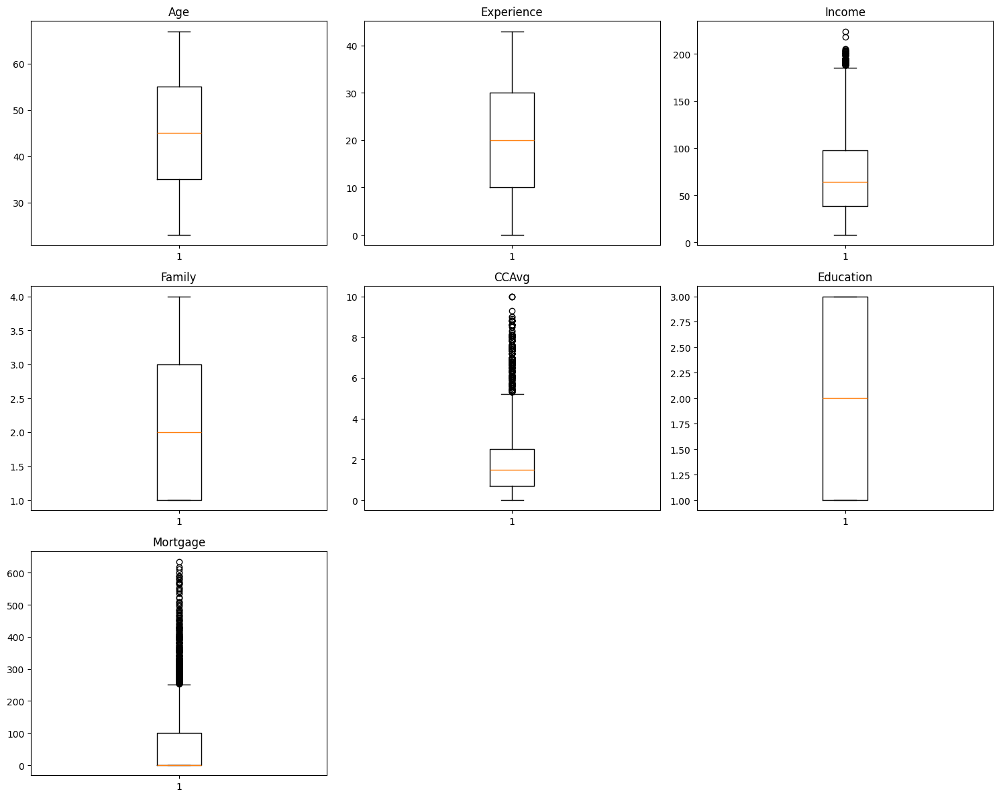

In [28]:
EDA.boxplot_outliers(data)

#### Heatmap to understand relationships

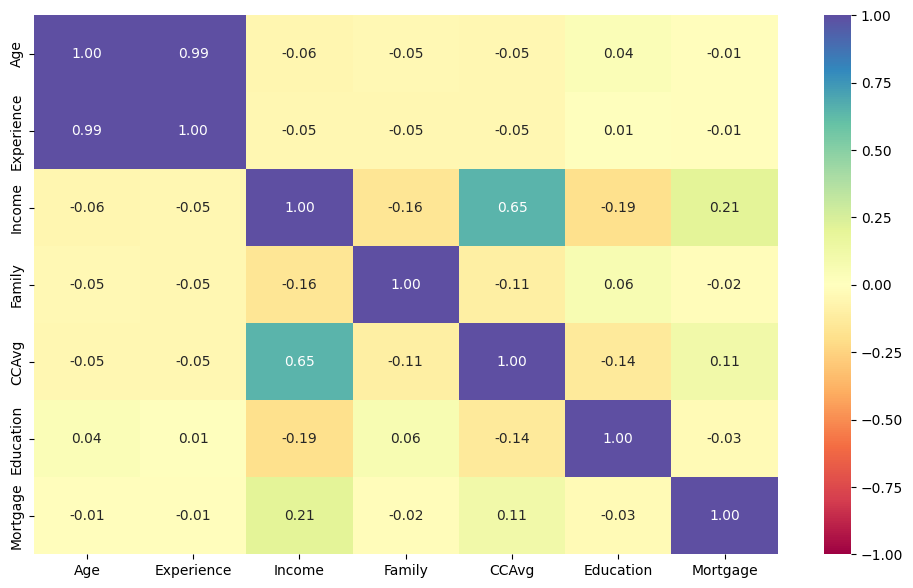

In [29]:
EDA.heatmap_all(data)

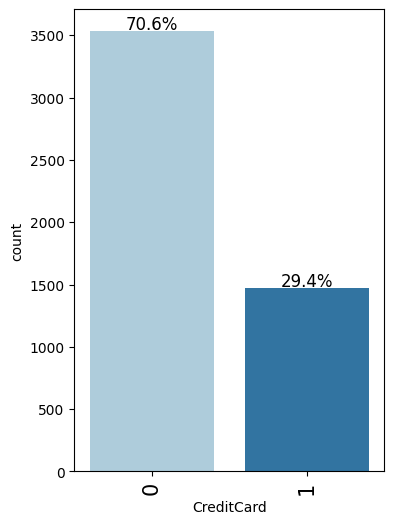

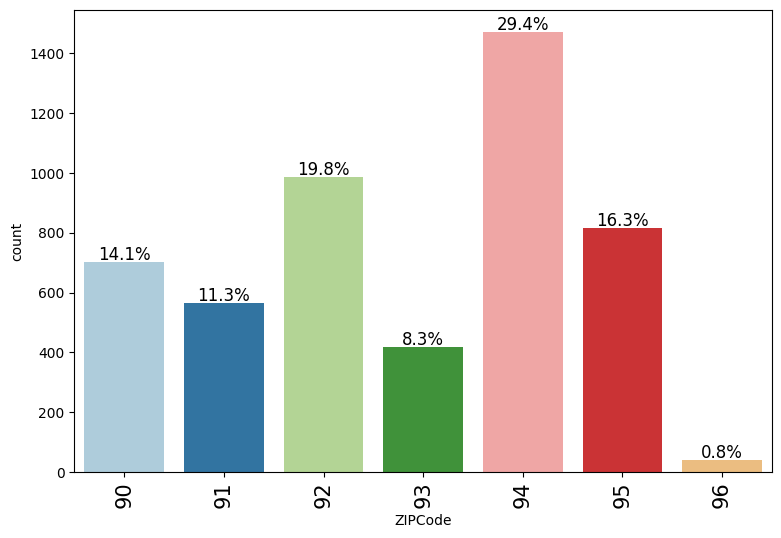

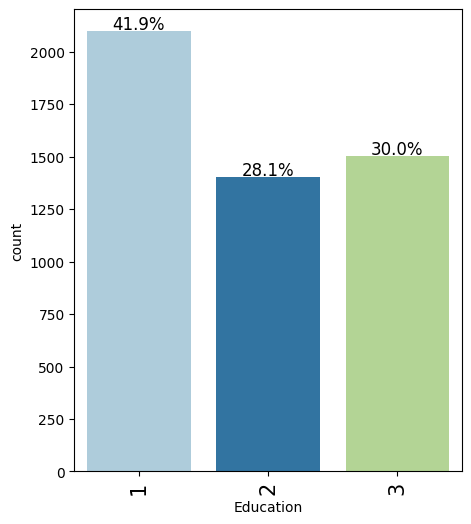

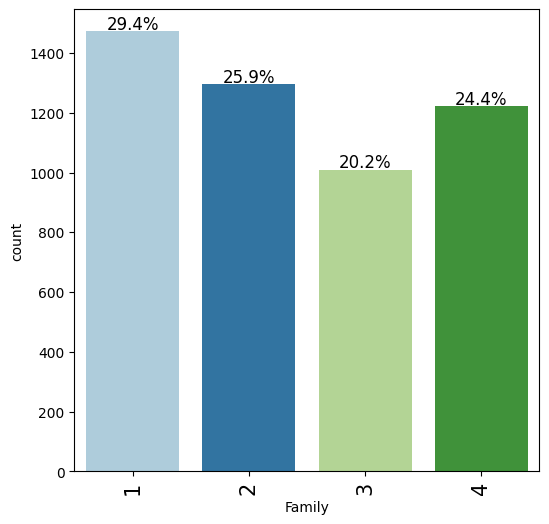

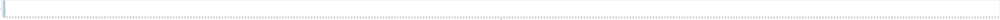

In [30]:
EDA.barplot_labeled(data,"CreditCard",True)
EDA.barplot_labeled(data,"ZIPCode",True)
EDA.barplot_labeled(data,"Education",True)
EDA.barplot_labeled(data,"Family",True)
EDA.barplot_labeled(data,'Mortgage',True)


#### Pairplot to verify relationships

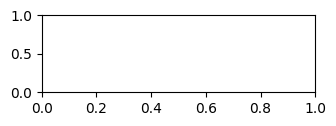

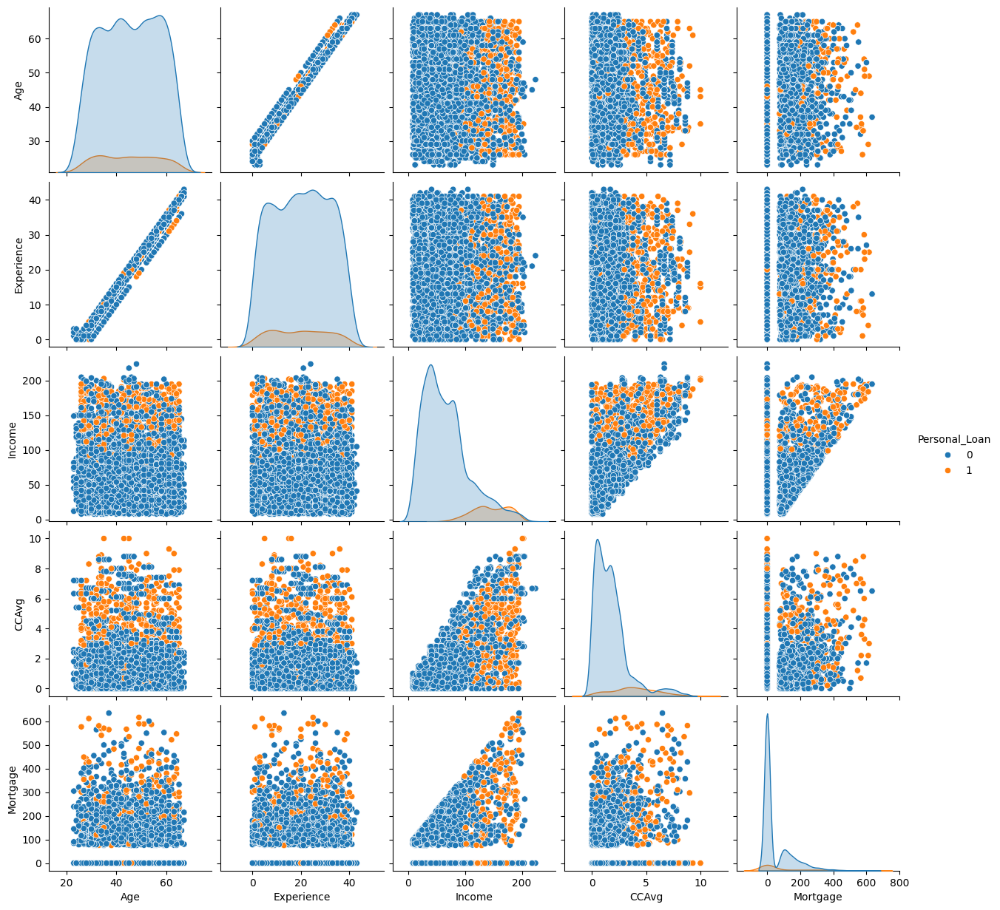

----------------------------------------------------------------------------------------------------


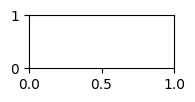

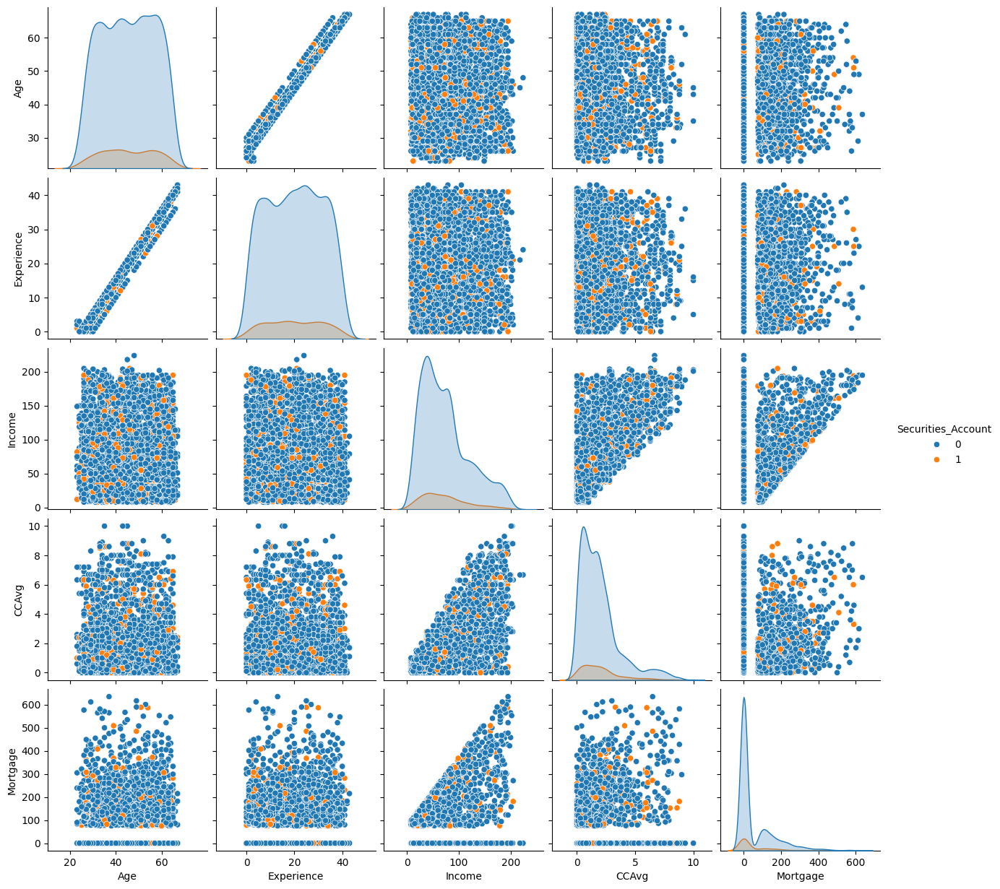

----------------------------------------------------------------------------------------------------


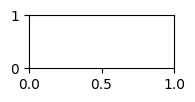

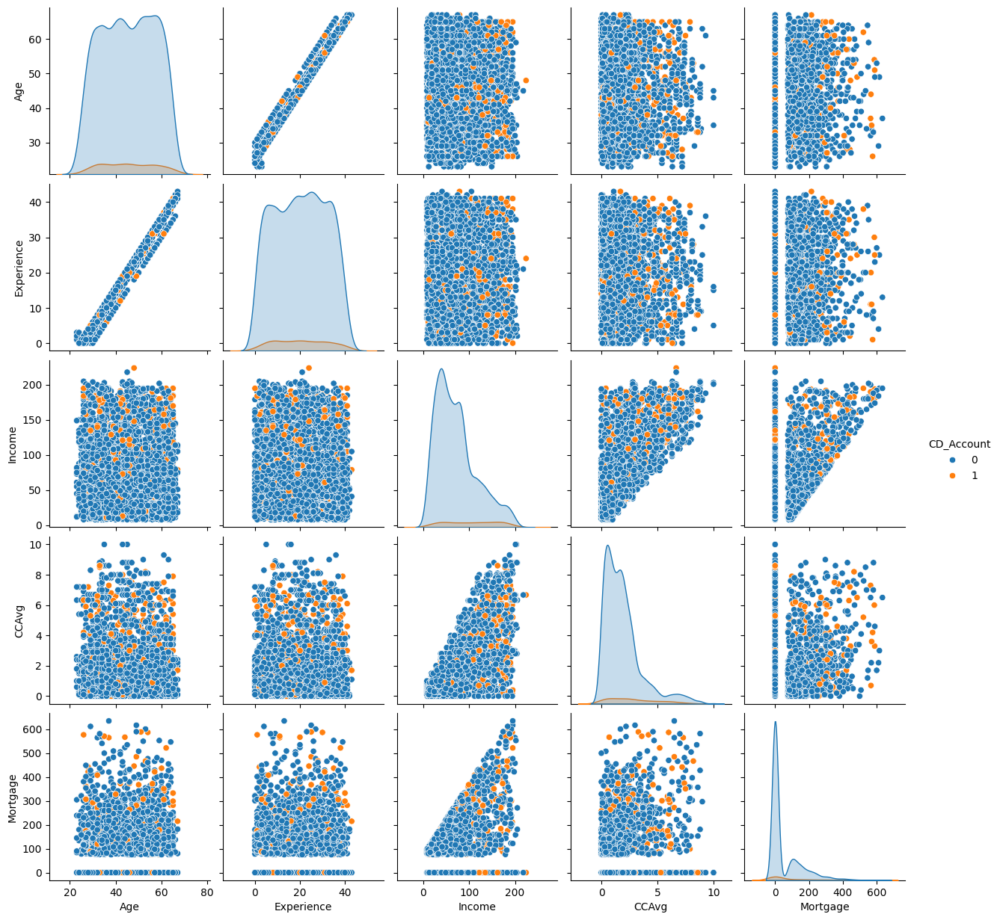

----------------------------------------------------------------------------------------------------


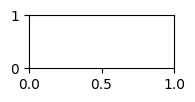

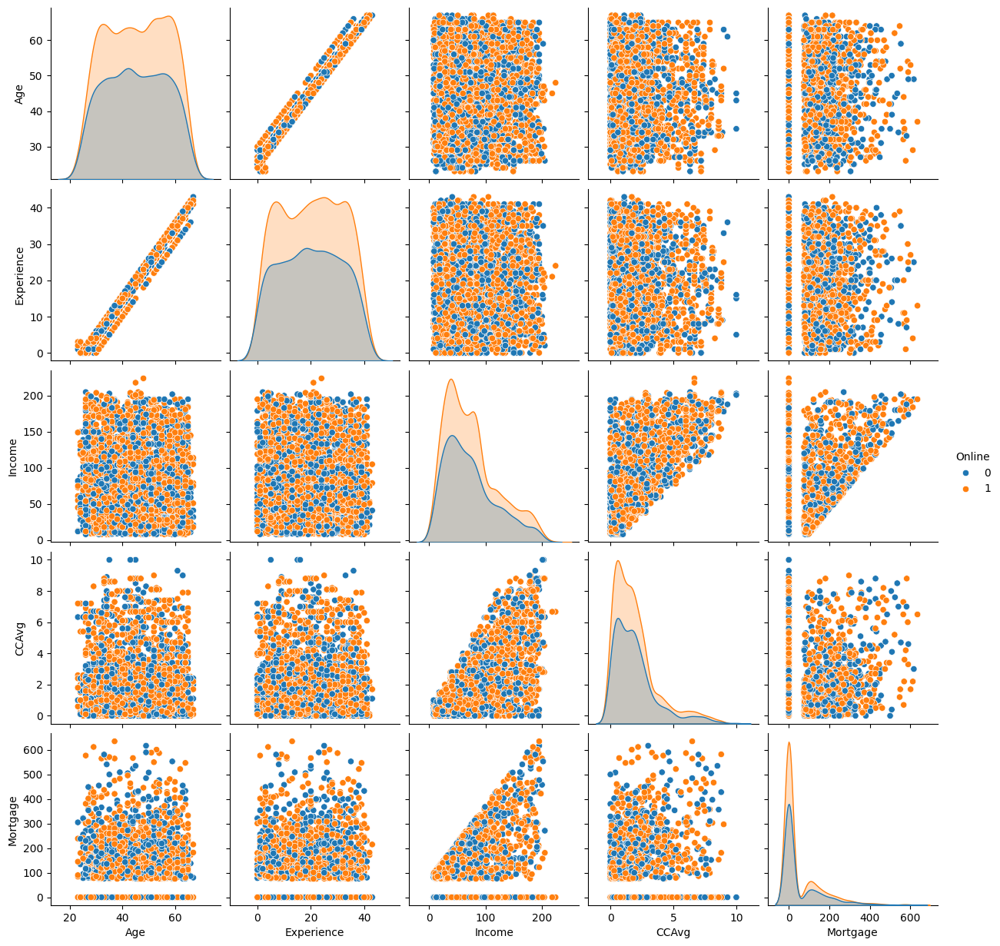

----------------------------------------------------------------------------------------------------


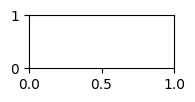

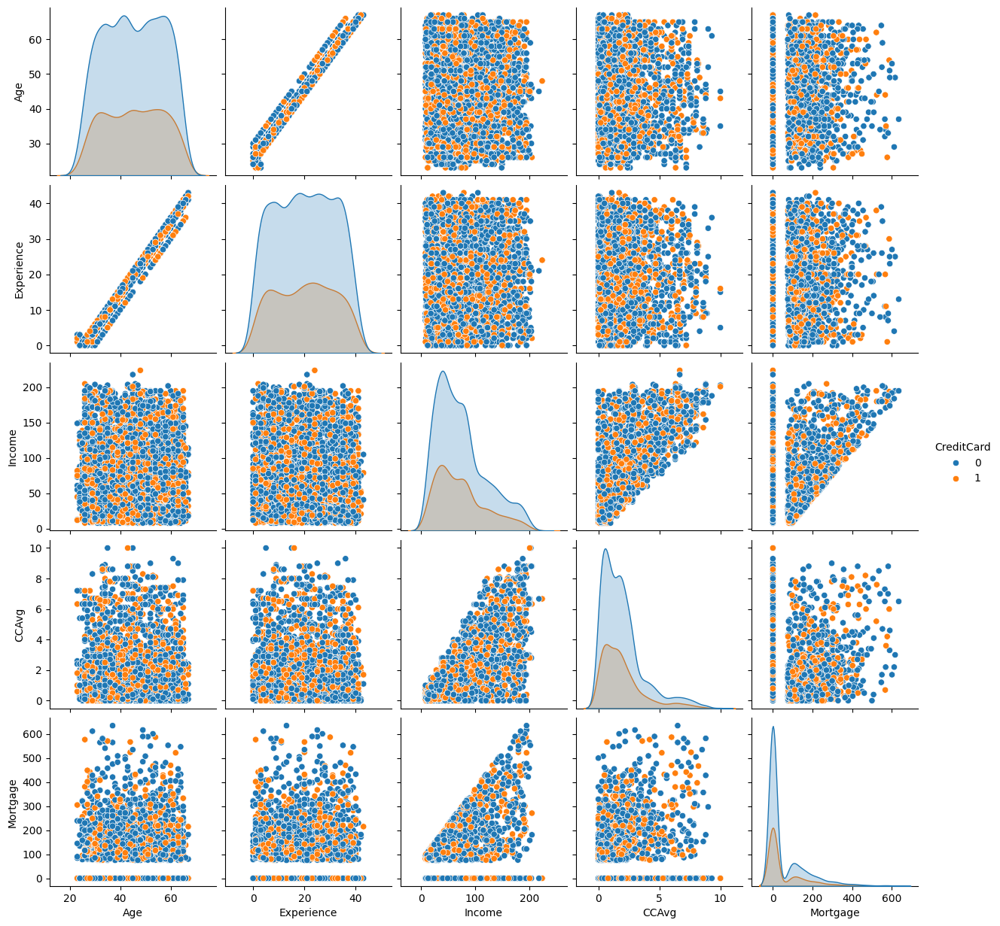

----------------------------------------------------------------------------------------------------


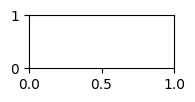

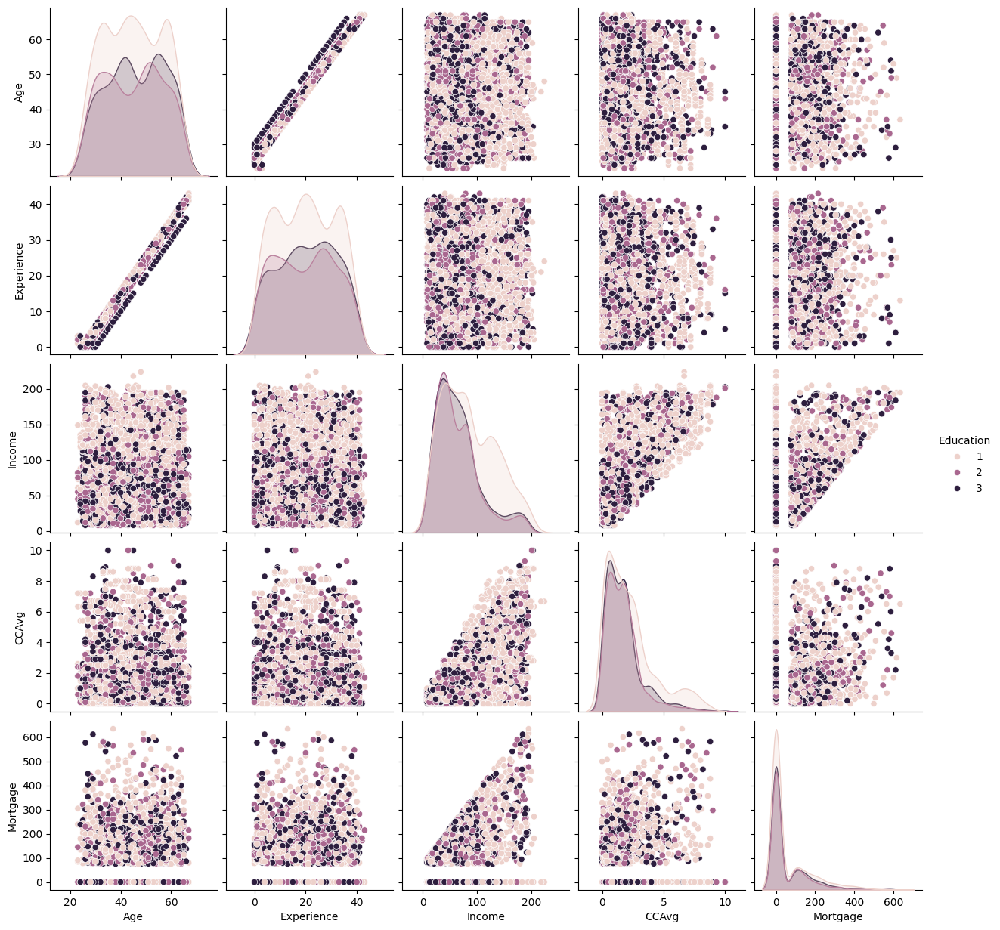

----------------------------------------------------------------------------------------------------


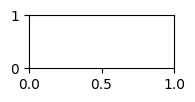

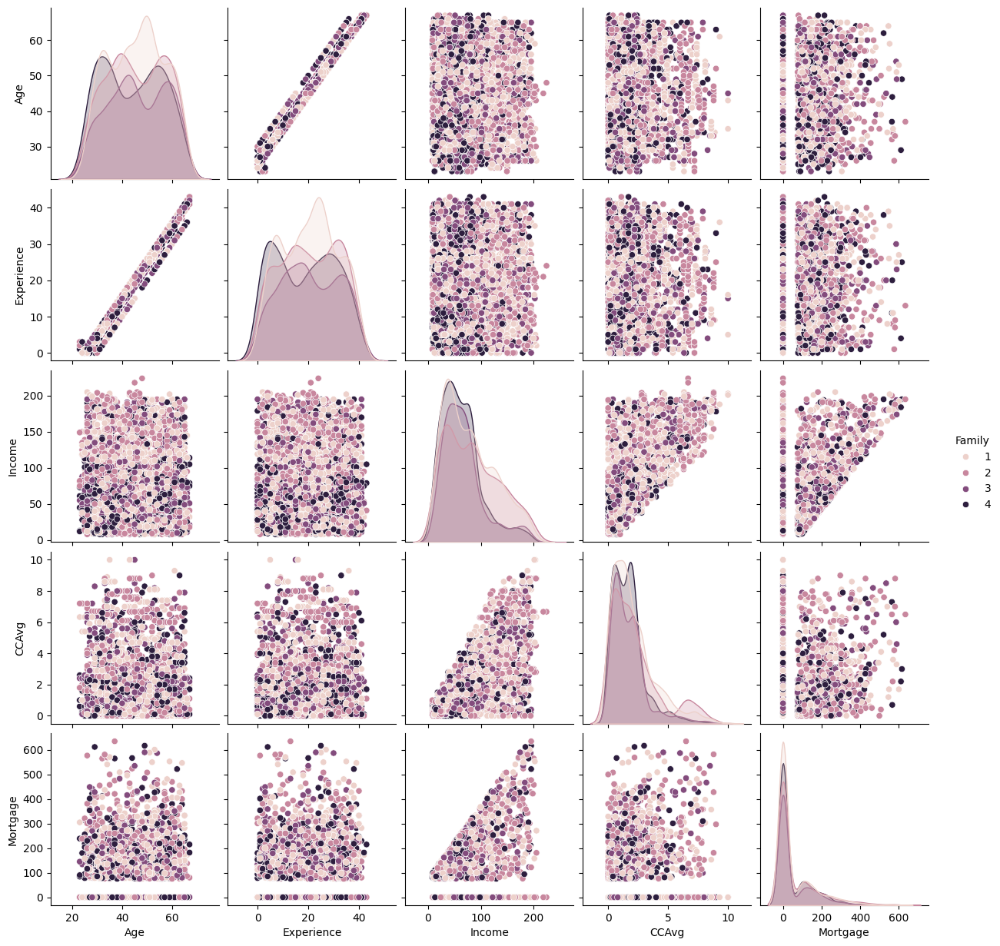

----------------------------------------------------------------------------------------------------


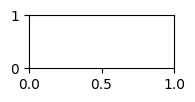

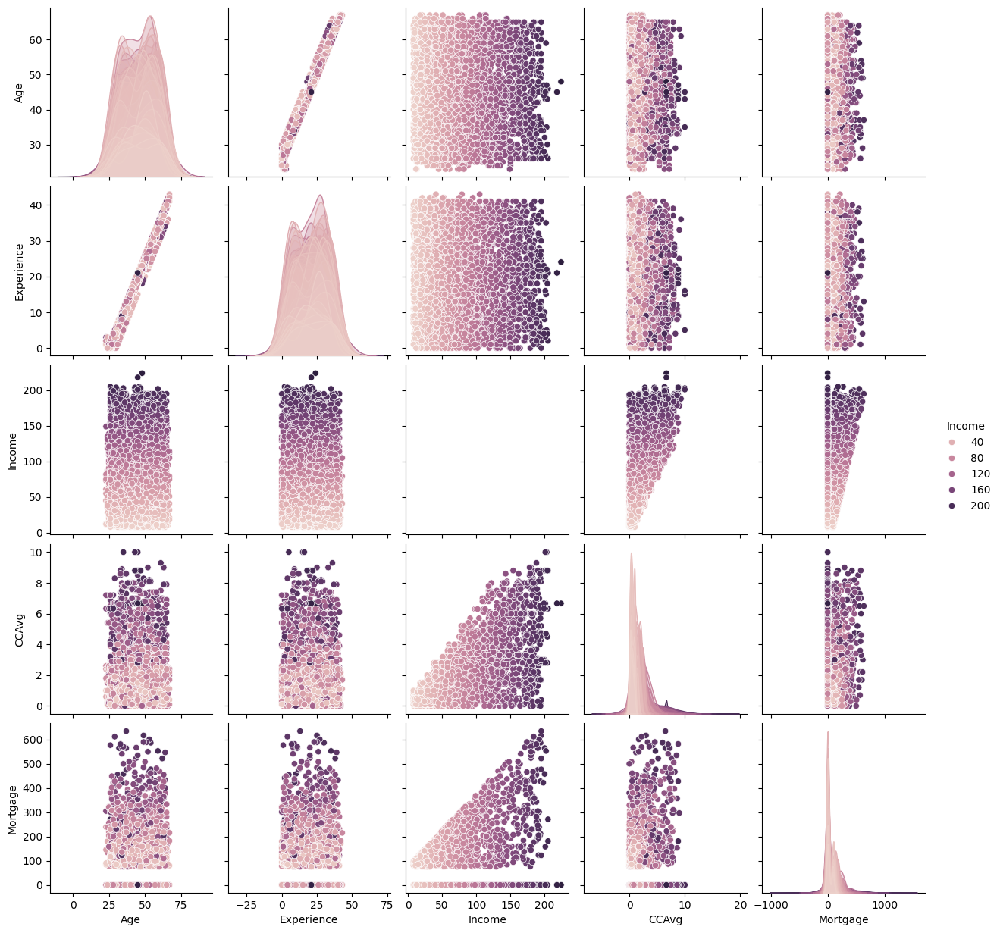

----------------------------------------------------------------------------------------------------


In [31]:
# Family	5000.0	2.396400	1.147663	1.0	1.00	2.0	3.00	4.0
# Education	5000.0	1.881000	0.839869	1.0	1.00	2.0	3.00	3.0
# Personal_Loan	5000.0	0.096000	0.294621	0.0	0.00	0.0	0.00	1.0
# Securities_Account	5000.0	0.104400	0.305809	0.0	0.00	0.0	0.00	1.0
# CD_Account	5000.0	0.060400	0.238250	0.0	0.00	0.0	0.00	1.0
# Online	5000.0	0.596800	0.490589	0.0	0.00	1.0	1.00	1.0
# CreditCard	5000.0	0.294000	0.455637	0.0	0.00	0.0	1.00	1.0
EDA.pairplot_all(data=data, hues=["Personal_Loan",
                                  "Securities_Account",
                                  "CD_Account","Online",
                                  "CreditCard",
                                  "Education",
                                  "Family",
                                  "Income"]
                                  )

#### Check Quartile ranges

In [32]:
Q1 = data.select_dtypes(include=["float64", "int64"]).quantile(0.25)  # To find the 25th percentile and 75th percentile.
Q3 = data.select_dtypes(include=["float64", "int64"]).quantile(0.75)

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

# Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

print("Lower Boundaries:\n", lower)
print("\nUpper Boundaries:\n", upper)

# Calculating percentage of outliers in each numerical column
(
    (data.select_dtypes(include=["float64", "int64"]) < lower)
    | (data.select_dtypes(include=["float64", "int64"]) > upper)
).sum() / len(data) * 100

Lower Boundaries:
 Age             5.0
Experience    -20.0
Income        -49.5
Family         -2.0
CCAvg          -2.0
Education      -2.0
Mortgage     -151.5
dtype: float64

Upper Boundaries:
 Age            85.0
Experience     60.0
Income        186.5
Family          6.0
CCAvg           5.2
Education       6.0
Mortgage      252.5
dtype: float64


Age           0.00
Experience    0.00
Income        1.92
Family        0.00
CCAvg         6.48
Education     0.00
Mortgage      5.82
dtype: float64

#### EDA Observations

- Age and Experience seem to go together, so we may not need both. 

**Questions**:

1. What is the distribution of mortgage attribute? Are there any noticeable patterns or outliers in the distribution?
    1. Distribution Plots - The histograms and Kernel Density Estimates (KDEs) show how the mortgage amount is distributed for each group: 
        - Target = 0 (No Loan): The distribution is highly skewed to the right and is extremely concentrated near zero. This indicates that the majority of customers who did not accept the personal loan have very low or zero mortgage balances.
        - Target = 1 (Accepted Loan): The distribution is also skewed right, but it is much wider and flatter than the "No Loan" group. This indicates that customers who accepted the personal loan have a higher and more varied range of mortgage balances.
    1. Boxplots - The boxplots visualize the central tendency and spread of the mortgage variable for both groups.
        - Boxplot w.r.t Target (Left): This plot includes all data points (including outliers).
            - Group 0 (No Loan): The median and interquartile range (IQR, the box) are very low, centered near zero. However, there are numerous outliers extending up to and over 600, suggesting some customers with high mortgages did not take a loan.
            - Group 1 (Accepted Loan): The median and IQR are significantly higher than Group 0, indicating a clear separation between the average mortgage amounts of the two groups. It also has many high outliers.
        - Boxplot (without outliers) w.r.t Target (Right): This plot provides a clearer view of the central data mass.
            - Group 0 (No Loan): The central box (25th to 75th percentile) remains close to zero (around 0-100), confirming that most non-loan takers have small mortgages.
            - Group 1 (Accepted Loan): The central box is much higher (ranging approximately from 0-200), confirming that the typical customer who took a personal loan has a substantially larger mortgage balance compared to the typical customer who did not.
    1. The evidence strongly suggests that customers with higher mortgage balances are more likely to accept a personal loan. The median mortgage for the loan-accepting group (1) is much higher than the median for the non-accepting group (0). This feature could be a strong predictor in a model aiming to determine loan acceptance.
2. How many customers have credit cards?
    - Total of 108 customers have credit cards
3. What are the attributes that have a strong correlation with the target attribute (personal loan)?
    - Strong Correlation: Income
        - The Income variable shows the most distinct separation.
        - The orange dots (Loan = 1) are heavily concentrated in the high-income regions of the graphs (especially noticeable in the scatter plots of Income vs. CCAvg and Income vs. Mortgage).
        - The density plot for Income on the diagonal clearly shows the orange distribution shifted significantly to higher values compared to the blue distribution. This indicates that customers with higher incomes are far more likely to accept the personal loan.
    - Moderate Correlation: CCAvg
        - The CCAvg (Average Credit Card Spending) also shows a visible difference:
        - The orange dots are more spread out toward the higher CCAvg values than the blue dots, suggesting a moderate positive correlation.
    - Weak/Negligible Correlation: Age, Experience, and Mortgage
        - Age and Experience: The colors are almost perfectly intermixed in the scatter plots, and the diagonal distributions overlap entirely. These variables show negligible correlation with loan acceptance.
        - Mortgage: While there is some separation, the distributions overlap significantly, indicating a weak correlation compared to Income.
4. How does a customer's interest in purchasing a loan vary with their age?
    - The charts indicate that Age has a negligible correlation with the Personal_Loan variable. There is virtually no difference in the age distribution or central tendency between customers who accepted the loan and those who did not.
    - Distribution Plots 
        - Shape: Both the distribution for Target = 0 (No Loan) and Target = 1 (Accepted Loan) are roughly uniform across the age range shown (approximately 25 to 65). The Kernel Density Estimates (KDEs) and histograms for both groups look very similar.
        - Conclusion: There is no clear age bracket where customers are significantly more or less likely to take the loan.
    - Boxplots 
        - Central Tendency:
            - The median (the line inside the box) is almost identical for both Group 0 and Group 1, settling around the mid-40s.
            - The interquartile range (IQR), which represents the middle 50% of the data (the box itself), is also nearly identical in position and size for both groups.
        - Spread: The whiskers (min/max range without outliers) and the overall spread of the data are highly consistent between the two loan categories.
        - Conclusion: The central tendency and spread of Age are the same regardless of whether the customer took the loan.
    - Strong correlation between Age and Experience is seen. We may not need both values, we can drop Age completely. 
5. How does a customer's interest in purchasing a loan vary with their education?
    - The data reveals that Education level is a significant factor in loan acceptance, showing a different preference pattern for each group.
    - Key Observations on Education and Loan Acceptance
        - Distribution Plots 
            - The histograms show how the different educational categories are distributed across the two groups:
            - Target = 0 (No Loan): This distribution is somewhat U-shaped. The highest density is seen at Education = 1 and Education = 3, with a notable dip at Education = 2. This suggests that customers who did not take the loan are most commonly found at the lowest and highest educational levels.
            - Target = 1 (Accepted Loan): The density is much higher at Education = 2 and Education = 3. The lowest density is at Education = 1. This indicates that customers who accepted the personal loan are disproportionately concentrated in the higher educational categories (2 and 3).
        - Boxplots 
            - Since Education is an ordered categorical variable (likely interval/ordinal), the boxplots show the relative preference:
            - Median and Spread: The boxplots show that the median educational level (the line inside the box) for both groups is 2. However, the blue box (Target=1) is visually shifted higher compared to the green box (Target=0).
            - Interquartile Range (IQR): The IQR for Group 1 (Accepted Loan) spans from approximately 1.8 to 3.0, indicating that the majority of loan-takers are at the higher end of the scale. The IQR for Group 0 (No Loan) is spread across 1.0 to 2.8, indicating a much broader mix that includes the lowest education level.
        - Conclusion
            - Education is a strong predictive feature. Specifically:
            - Higher Education Pays Off: Customers with Education levels 2 and 3 are much more likely to accept a personal loan.
            - Lowest Education Aversion: Customers with Education level 1 are the least likely to accept the personal loan

#### Data Preprocessing

* Missing value treatment
* Feature engineering (if needed)
* Outlier detection and treatment (if needed)
* Preparing data for modeling
* Any other preprocessing steps (if needed)

## Model Work

### Model Evaluation Criterion

1. Linear Regression 
    - The linear regression requires prediction of continuous variable with relation to indepdent variables.
1. K-Means Clusters
    - Clustering requires grouping of data elements based on characteristics
    - These groups are used to provide meaningful insites on data tendencies that can be applied to business outcomes. 
1. Decision Tree
    - Predition of decision based on machine learning of data
    - Predicting a condition or a value that is determined by sequences of decisions to derive to final outcome. 

Clearly this problem can be solved effectively with Decision Tree algorithm. Possibility of purchasing a personal loan based on customer demographic can be determined by Linear Regression as well, but it would be more accurate to solve with Decision Tree. 

### Create Test and Train

In [33]:
# Dropping Experience as it is perfectly correlated with Age
# We don't need both, as it may sway or make the model unncessarily complex.

# Create Predictors and Expected datasets. 
X = data.drop(["Personal_Loan", "Experience"], axis=1)
Y = data["Personal_Loan"]

# We can get dummies for Zip code adn Education. 
X = pd.get_dummies(X, columns=["ZIPCode", "Education"], drop_first=True)

X = X.astype(float)

# Splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

#Check the values now. 
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (4000, 17)
Shape of test set :  (1000, 17)
Percentage of classes in training set:
Personal_Loan
0    0.905
1    0.095
Name: proportion, dtype: float64
Percentage of classes in test set:
Personal_Loan
0    0.9
1    0.1
Name: proportion, dtype: float64


### Model Default 

In [34]:
model_default = DecisionTreeClassifier(criterion="gini", random_state=42)
model_default.fit(X_train, y_train)
display(model_default)
model_default_perf =  DT.model_performance_classification(model=model_default,predictors=X_test,expected=y_test)
display(model_default_perf)

DecisionTreeClassifier(random_state=42)

,Accuracy,Recall,Precision,F1
0,0.983,0.89,0.936842,0.912821


#### Model Default - Visualize Decision Tree

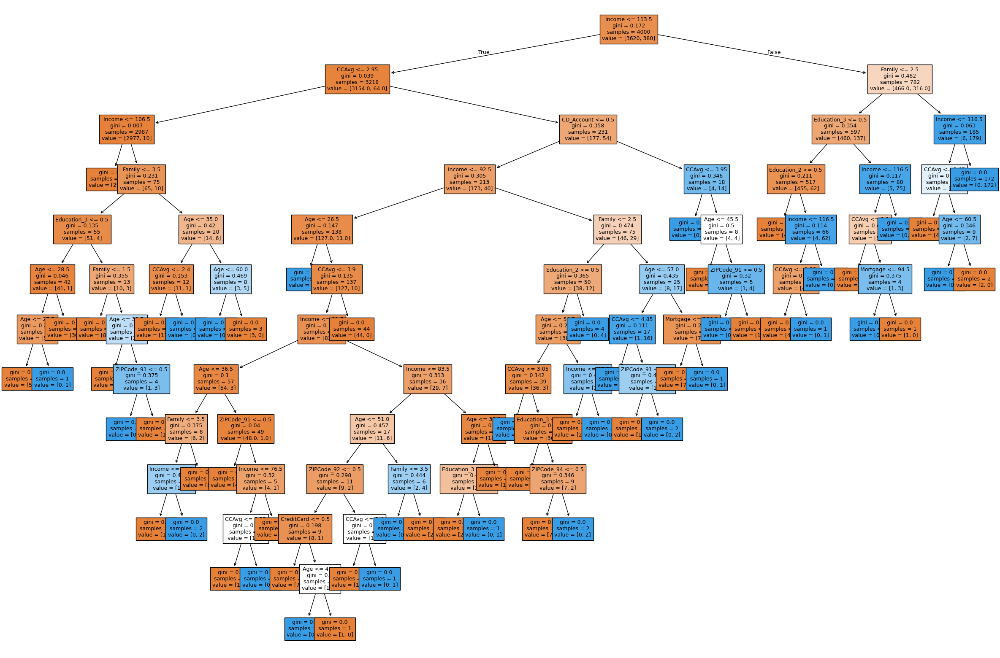

|--- Income <= 113.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2912.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- Family <= 3.50
|   |   |   |   |--- Education_3 <= 0.50
|   |   |   |   |   |--- Age <= 28.50
|   |   |   |   |   |   |--- Age <= 27.50
|   |   |   |   |   |   |   |--- weights: [5.00, 0.00] class: 0
|   |   |   |   |   |   |--- Age >  27.50
|   |   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |--- Age >  28.50
|   |   |   |   |   |   |--- weights: [36.00, 0.00] class: 0
|   |   |   |   |--- Education_3 >  0.50
|   |   |   |   |   |--- Family <= 1.50
|   |   |   |   |   |   |--- weights: [8.00, 0.00] class: 0
|   |   |   |   |   |--- Family >  1.50
|   |   |   |   |   |   |--- Age <= 33.50
|   |   |   |   |   |   |   |--- weights: [1.00, 0.00] class: 0
|   |   |   |   |   |   |--- Age >  33.50
|   |   |   |   |   |   |   |--- ZIPCode_91 <= 0.50
|   |   |   |   |   |   |   |   |--- weig

,Feature,Importance
1,Income,0.322004
2,Family,0.244836
15,Education_2,0.155041
16,Education_3,0.138819
3,CCAvg,0.056721
0,Age,0.047714
6,CD_Account,0.016799
9,ZIPCode_91,0.006968
4,Mortgage,0.004725
12,ZIPCode_94,0.004523


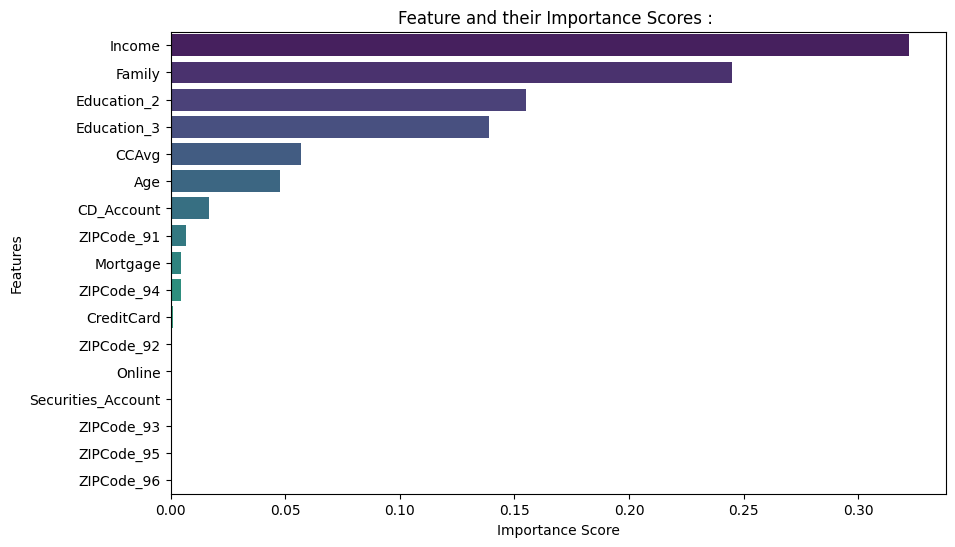

****************************************************************************************************


In [35]:
DT.visualize_decision_tree(model=model_default,features=X.columns,classes=None,figsize=(30,20),showtext=True,showimportance=True)

Observations 
Looks like Income Family, Education (2 and 3) are most important variables for Personal Loan

#### Nodel Default - Confusion Matrix

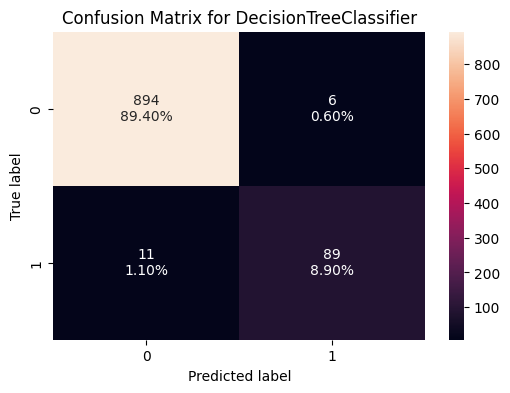

In [36]:
DT.plot_confusion_matrix(model=model_default,predictors=X_test,expected=y_test)

## Model - Pruning - Reduce Over/Under fittings

### Pre Pruning

In [37]:
#Prepruning the decision tree to avoid overfitting
pre_pruning = DT.prepruning_nodes_samples_split(X_train=X_train,
                        y_train=y_train,
                        X_test=X_test,
                        y_test=y_test,
                        max_depth_v=(2,9,2),
                        max_leaf_nodes_v=(50,250,50),
                        min_samples_split_v=(10,70,10),
                        printall=False,
                        sortresultby="F1")

display(pre_pruning['model'])
display(HTML("<h3>Prepruning Traing Performance</h3>"))
display(pre_pruning['prepruning_train_perf'])
display(HTML("<h3>PReppruning Test Performance</h3>"))
display(pre_pruning['prepruning_test_perf'])
display(HTML("<h3>Prepruning - Tuned -  Huper Parameters</h3>"))
display(pre_pruning['prepruning_scores_tuned'])
display(HTML("<h3>Prepruning - All Scores </h3>"))
display(pre_pruning['prepruning_scores_all'])


KeyError: 7

### Post Pruning

In [ ]:
post_pruning =  DT.postpruning_cost_complexity(X_train=X_train,
                          y_train=y_train,
                          X_test=X_test,
                          y_test=y_test,
                          printall=True,
                          figsize=(10,6))



## Model Performance Comparison and Final Model Selection - Pruning

In [ ]:
models_train_comp_df = pd.concat([
                model_default_perf.T,
                pre_pruning['prepruning_train_perf'].T,
                pre_pruning['prepruning_test_perf'].T,
                post_pruning['postpruning_train_perf'].T,
                post_pruning['postpruning_test_perf'].T
            ],
            axis=1,
        )
models_train_comp_df.columns = [
    "Decision Tree (sklearn default)",
    "Decision Tree (Pre-Pruning - Train)",
    "Decision Tree (Pre-Pruning - Test)",
    "Decision Tree (Post-Pruning - Train)",
    "Decision Tree (Post-Pruning - Test)",
]
print("Training performance comparison:")
display(models_train_comp_df.T)
display(model_default,pre_pruning['model'],post_pruning['model'])

# Appendix

## Other way to do the same

### Prepruning

In [ ]:
model_prepruning1 = DT.tune_decision_tree(
                        X_train=X_train,
                        y_train=y_train,
                        X_test=X_test,
                        y_test=y_test,
                        max_depth_v=(2,9,2),
                        max_leaf_nodes_v=(50,250,50),
                        min_samples_split_v=(10,70,10),
                        printall=True,
                        sortresultby="F1"
                     )
# Fit the best algorithm to the data.
model_prepruning1 = model_prepruning1.fit(X=X_train,y=y_train) 

features = list(X_train.columns)
DT.visualize_decision_tree(model=model_prepruning1,features=features,classes=None,figsize=(20,20),showtext=True)

print("model_prepruning_train_perf")
DT.plot_confusion_matrix(model=model_prepruning1,predictors=X_test,expected=y_test)
model_prepruning_train_perf1 = DT.model_performance_classification(model=model_prepruning1,predictors=X_train,expected=y_train) 
display(model_prepruning_train_perf1)

print("model_prepruning_perf_test")
DT.plot_confusion_matrix(model_prepruning1, X_test, y_test)
model_prepruning_test_perf1 = DT.model_performance_classification(model=model_prepruning1,predictors=X_test,expected=y_test) 
display(model_prepruning_test_perf1)

### Post Pruning

In [ ]:
# Create an instance of the decision tree model
clf = DecisionTreeClassifier(random_state=42)

# Compute the cost complexity pruning path for the model using the training data
path = clf.cost_complexity_pruning_path(X_train, y_train)

# Extract the array of effective alphas from the pruning path,  Extract the array of total impurities at each alpha along the pruning path
ccp_alphas, impurities = path.ccp_alphas, path.impurities

display(pd.DataFrame({'ccp_alphas': ccp_alphas, 'impurities': impurities}))

In [ ]:
# Create a figure
fig, ax = plt.subplots(figsize=(10, 5))

# Plot the total impurities versus effective alphas, excluding the last value,
# using markers at each data point and connecting them with steps
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")

# Set the x-axis label
ax.set_xlabel("Effective Alpha")

# Set the y-axis label
ax.set_ylabel("Total impurity of leaves")

# Set the title of the plot
ax.set_title("Total Impurity vs Effective Alpha for training set");

In [ ]:
#Initialize an empty list to store the decision tree classifiers
clfs = []

# Iterate over each ccp_alpha value extracted from cost complexity pruning path
for ccp_alpha in ccp_alphas:
    # Create an instance of the DecisionTreeClassifier
    clf = DecisionTreeClassifier(ccp_alpha=ccp_alpha, random_state=42)

    # Fit the classifier to the training data
    clf.fit(X_train, y_train)

    # Append the trained classifier to the list
    clfs.append(clf)

# Print the number of nodes in the last tree along with its ccp_alpha value
print(
    "Number of nodes in the last tree is {} with ccp_alpha {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

In [ ]:
# Remove the last classifier and corresponding ccp_alpha value from the lists
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

# Extract the number of nodes in each tree classifier
node_counts = [clf.tree_.node_count for clf in clfs]

# Extract the maximum depth of each tree classifier
depth = [clf.tree_.max_depth for clf in clfs]

# Create a figure and a set of subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 7))

# Plot the number of nodes versus ccp_alphas on the first subplot
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("Alpha")
ax[0].set_ylabel("Number of nodes")
ax[0].set_title("Number of nodes vs Alpha")

# Plot the depth of tree versus ccp_alphas on the second subplot
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("Alpha")
ax[1].set_ylabel("Depth of tree")
ax[1].set_title("Depth vs Alpha")

# Adjust the layout of the subplots to avoid overlap
fig.tight_layout()

In [ ]:
train_f1_scores = []  # Initialize an empty list to store F1 scores for training set for each decision tree classifier

# Iterate through each decision tree classifier in 'clfs'
for clf in clfs:
    # Predict labels for the training set using the current decision tree classifier
    pred_train = clf.predict(X_train)

    # Calculate the F1 score for the training set predictions compared to true labels
    f1_train = f1_score(y_train, pred_train)

    # Append the calculated F1 score to the train_f1_scores list
    train_f1_scores.append(f1_train)

test_f1_scores = []  # Initialize an empty list to store F1 scores for test set for each decision tree classifier

# Iterate through each decision tree classifier in 'clfs'
for clf in clfs:
    # Predict labels for the test set using the current decision tree classifier
    pred_test = clf.predict(X_test)

    # Calculate the F1 score for the test set predictions compared to true labels
    f1_test = f1_score(y_test, pred_test)

    # Append the calculated F1 score to the test_f1_scores list
    test_f1_scores.append(f1_test)

# Create a figure
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("Alpha")  # Set the label for the x-axis
ax.set_ylabel("F1 Score")  # Set the label for the y-axis
ax.set_title("F1 Score vs Alpha for training and test sets")  # Set the title of the plot

# Plot the training F1 scores against alpha, using circles as markers and steps-post style
ax.plot(ccp_alphas, train_f1_scores, marker="o", label="training", drawstyle="steps-post")

# Plot the testing F1 scores against alpha, using circles as markers and steps-post style
ax.plot(ccp_alphas, test_f1_scores, marker="o", label="test", drawstyle="steps-post")

ax.legend();  # Add a legend to the plot

In [ ]:
# creating the model where we get highest test F1 Score
index_best_model = np.argmax(test_f1_scores)

# selcting the decision tree model corresponding to the highest test score
model_postpruning1 = clfs[index_best_model]
display(model_postpruning1)

# Postpruning
DT.plot_confusion_matrix(model=model_postpruning1, predictors=X_train,expected= y_train,title="Post Pruning - Training Set Confusion Matrix")
model_postpruning_train_perf1 = DT.model_performance_classification(model=model_postpruning1,predictors= X_train, expected=y_train,title="Post Pruning - Training Set Performance")

DT.plot_confusion_matrix(model=model_postpruning1, predictors=X_test,expected= y_test, title="Post Pruning - Test Set Confusion Matrix")
model_postpruning_test_perf1 = DT.model_performance_classification(model=model_postpruning1, predictors= X_test, expected= y_test, title="Post Pruning - Test Set Performance")

DT.visualize_decision_tree(model=model_postpruning1,features=X.columns,classes=None,figsize=(20,20),showtext=True,showimportance=True)

### Model Performance Comparison and Final Model Selection - Other way

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat([
                model_default_perf.T,
                model_prepruning_train_perf1.T,
                model_prepruning_test_perf1.T,
                model_postpruning_train_perf1.T,
                model_postpruning_test_perf1.T
            ],
            axis=1,
        )
models_train_comp_df.columns = [
    "Decision Tree (sklearn default)",
    "Decision Tree (Pre-Pruning - Train)",
    "Decision Tree (Pre-Pruning - Test)",
    "Decision Tree (Post-Pruning - Train)",
    "Decision Tree (Post-Pruning - Test)",
]
print("Training performance comparison:")
display(models_train_comp_df.T)
display(model_default,model_prepruning1,model_postpruning1)

## Actionable Insights and Business Recommendations


* What recommedations would you suggest to the bank?
    - Income, Family size and Higher education are really the main drivers.
    - People with higher income may take personal loan has 30% higher chance than all others 
    - People with "Average spending on credit cards per month" have high disposition 
    - People with "Large family size" are more likely to take a personal loan. 
    - People with "Higher Education" can take personal loan easily. 

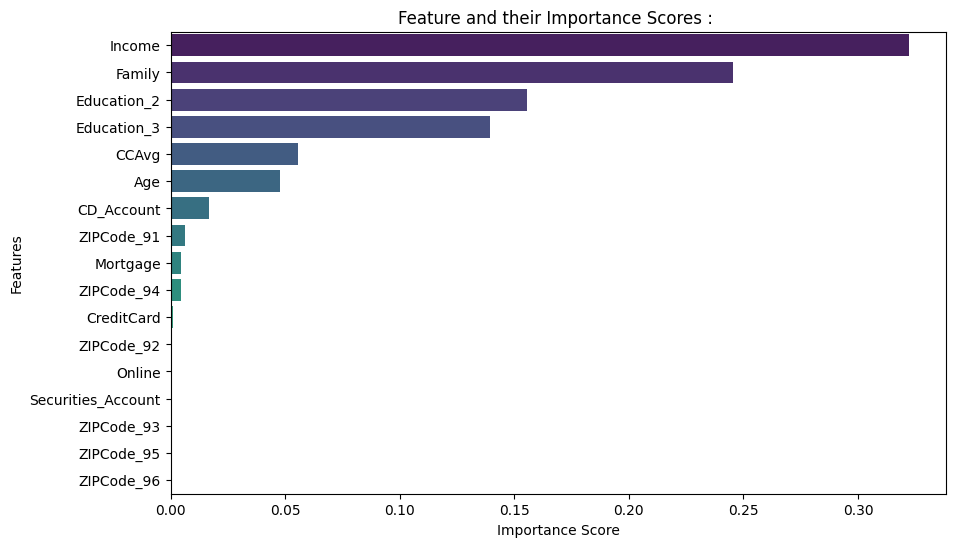

- Zipcode has no impact on the personal loan choices, business can take it beyond CA area for business. 
- 

___

In [ ]:
!jupyter nbconvert --to html P2_PersonalLoanCampaign_VK_Notebook_Full_Code.ipynb